In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from meteostat import Point, Daily
from meteostat import Hourly
import holidays
from datetime import datetime, timedelta

def filter_holidays(holidays, start_date, end_date):
    start_ts = pd.Timestamp(start_date)
    end_ts = pd.Timestamp(end_date)
    
    return {
        date_key: holiday_name 
        for date_key, holiday_name in holidays.items() 
        if start_ts <= pd.Timestamp(date_key) <= end_ts
    }

def mark_special_days(df, holidays_df):
    # Create time mask for 7am to 1pm
    market_time = (df['timestamp'].dt.hour >= 7) & (df['timestamp'].dt.hour < 13)
    # Create day mask for Wednesdays and Saturdays
    market_day = df['timestamp'].dt.day_name().isin(['Wednesday', 'Saturday'])
    
    # Create column for Wednesdays and Saturdays
    df['market_day'] = (market_day & market_time).astype(int)
    
   # Create a temporary series for holidays that fall on Thursday
    #thursday_holidays = (df['timestamp'].dt.date.isin(holidays_df.date_holiday)) & (df['timestamp'].dt.day_name() == 'Thursday')
    holidays_df['date'] = pd.to_datetime(holidays_df['date_holiday'])

    thursday_holidays = holidays_df[holidays_df['date'].dt.day_name() == 'Thursday']
    print(thursday_holidays)
    # Mark Fridays that follow a Thursday holiday
    df['special_friday'] = ((df['timestamp']-timedelta(days=1)).dt.date.isin(thursday_holidays['date'].dt.date) & (df['timestamp'].dt.day_name() == 'Friday')).astype(int)
    #df['special_friday'] = thursday_holidays.shift(-1) & (df['timestamp'].dt.day_name() == 'Friday')
    #df['special_friday'] = df['special_friday'].astype(int)
    
    return df

data = pd.read_csv('./data/stadtgarage.csv')
events_df = pd.read_excel('./data/events.xlsx')
events_df['Date'] = pd.to_datetime(events_df['Date'])
df = pd.DataFrame(data)

df['timestamp'] = pd.to_datetime(df['timestamp'])
df = df.sort_values('timestamp')
start_date = pd.to_datetime('2023-11-30') 
end_date = pd.to_datetime('2024-11-12')
df = df[(df['timestamp'] >= start_date) & (df['timestamp'] <= end_date)]

austria_holidays = holidays.country_holidays('AT', subdiv='V', years=range(df['timestamp'].min().year, df['timestamp'].max().year+1))
filtered_holidays = filter_holidays(austria_holidays, start_date, end_date)
holidays_df = pd.DataFrame({'date_holiday': list(filtered_holidays.keys()), 'holiday': 'holiday'})
holidays_df = holidays_df.sort_values('date_holiday')
# Define the coordinates for Dornbirn, Austria
point = Point(47.4145, 9.7381)

weather_data_hourly = Hourly(point, start_date, end_date)
weather_data_hourly = weather_data_hourly.fetch()
weather_data_daily = Daily(point, start_date, end_date)
weather_data_daily = weather_data_daily.fetch()


weather_daily_cols = ['tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wspd', 'wpgt', 'pres']
# Reset index of weather data to make 'time' a regular column
weather_daily = weather_data_daily[weather_daily_cols].reset_index()
weather_hourly_cols = ['temp', 'dwpt', 'rhum', 'prcp', 'wspd', 'wpgt', 'pres', 'tsun']
weather_hourly = weather_data_hourly[weather_hourly_cols].reset_index()

# Round your original df timestamps to the nearest hour for matching
df['hour_timestamp'] = df['timestamp'].dt.floor('h')
# Create a date column for merging
df['date'] = df['timestamp'].dt.date
df['date_holiday'] = df['timestamp'].dt.date
df['date_event'] = df['timestamp'].dt.date
df['date_event'] = pd.to_datetime(df['date_event'])

weather_daily['time'] = weather_daily['time'].dt.date
# Merge using broadcast join
df = pd.merge_ordered(df, holidays_df, fill_method="ffill", left_by="date_holiday")
df = df.merge(weather_daily, left_on='date', right_on='time', how='left')
df = df.merge(weather_hourly, left_on='hour_timestamp',right_on='time',how='left')

df = df.merge(events_df, left_on='date_event', right_on='Date', how='left')
df = mark_special_days(df, holidays_df)
# Clean up if needed
df = df.drop('sensor_id', axis=1)
df = df.drop('date_holiday', axis=1)
df = df.drop('date_event', axis=1)
df = df.drop('time_x', axis=1)
df = df.drop('time_y', axis=1)
df = df.drop('Date', axis=1)


filtered_df = df[df['measurement_name'] == 'utilization'].copy()
print(filtered_df.head())
df.to_csv('output.csv', index=False)

  date_holiday  holiday       date
4   2024-05-09  holiday 2024-05-09
6   2024-05-30  holiday 2024-05-30
7   2024-08-15  holiday 2024-08-15
  measurement_name           timestamp  value hour_timestamp        date  \
0      utilization 2023-11-30 00:05:12     97     2023-11-30  2023-11-30   
2      utilization 2023-11-30 00:13:28     94     2023-11-30  2023-11-30   
4      utilization 2023-11-30 00:22:15     94     2023-11-30  2023-11-30   
6      utilization 2023-11-30 00:30:31     94     2023-11-30  2023-11-30   
9      utilization 2023-11-30 00:38:47     93     2023-11-30  2023-11-30   

  holiday  tavg  tmin  tmax  prcp_x  ...  dwpt  rhum  prcp_y  wspd_y  wpgt_y  \
0     NaN   0.8  -1.4   3.9    16.4  ...  -2.0  96.0     0.0     7.2    14.8   
2     NaN   0.8  -1.4   3.9    16.4  ...  -2.0  96.0     0.0     7.2    14.8   
4     NaN   0.8  -1.4   3.9    16.4  ...  -2.0  96.0     0.0     7.2    14.8   
6     NaN   0.8  -1.4   3.9    16.4  ...  -2.0  96.0     0.0     7.2    14.8   
9  

                    avg_utilization  max_utilization  min_utilization  \
avg_utilization            1.000000         0.755114         0.369481   
max_utilization            0.755114         1.000000         0.093902   
min_utilization            0.369481         0.093902         1.000000   
count_measurements         0.117132         0.436273         0.306580   

                    count_measurements  
avg_utilization               0.117132  
max_utilization               0.436273  
min_utilization               0.306580  
count_measurements            1.000000  


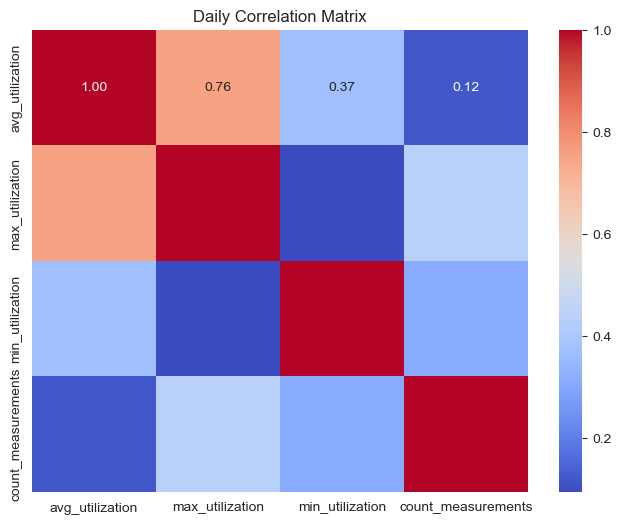

In [2]:

#filtered_df.loc[:,'date'] = filtered_df['timestamp'].dt.date 
filtered_df.loc[:, 'weekday'] = filtered_df['timestamp'].dt.day_name()# Extract only the 

# Aggregate Data (Daily Level)
daily_df = filtered_df.groupby('weekday').agg(
    avg_utilization=('value', 'mean'),  # Daily average utilization
    max_utilization=('value', 'max'),  # Daily max utilization
    min_utilization=('value', 'min'),  # Daily min utilization
    count_measurements=('value', 'count')  # Number of measurements per day
).reset_index()

# Compute Correlation Matrix
correlation_matrix = daily_df.corr(numeric_only=True)

# Display the correlation matrix
print(correlation_matrix)

# Visualizing the Correlation Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Daily Correlation Matrix")
plt.show()

                          value  temp  dwpt  rhum  prcp_y  wspd_y  wpgt_y  \
hour_timestamp                                                              
2023-11-30 00:00:00   94.000000  -1.4  -2.0  96.0     0.0     7.2    14.8   
2023-11-30 01:00:00   91.142857  -1.4  -2.0  96.0     0.0     3.6    15.1   
2023-11-30 02:00:00   89.000000  -1.2  -2.2  93.0     0.0     3.6     9.4   
2023-11-30 03:00:00   89.000000  -0.7  -2.6  87.0     0.0     0.0    11.2   
2023-11-30 04:00:00   89.000000   0.0  -2.1  86.0     0.0     3.6    10.1   
...                         ...   ...   ...   ...     ...     ...     ...   
2024-11-11 11:00:00  328.857143   7.1   3.9  80.0     0.0     3.6    13.0   
2024-11-11 12:00:00  257.857143   7.4   4.9  84.0     0.0     3.6    13.0   
2024-11-11 13:00:00  240.375000   7.4   4.5  82.0     0.0     3.6    19.4   
2024-11-11 14:00:00  262.428571   7.5   4.4  81.0     0.0     3.6    18.0   
2024-11-11 15:00:00  272.000000   7.5   4.4  81.0     0.0     3.6     8.6   

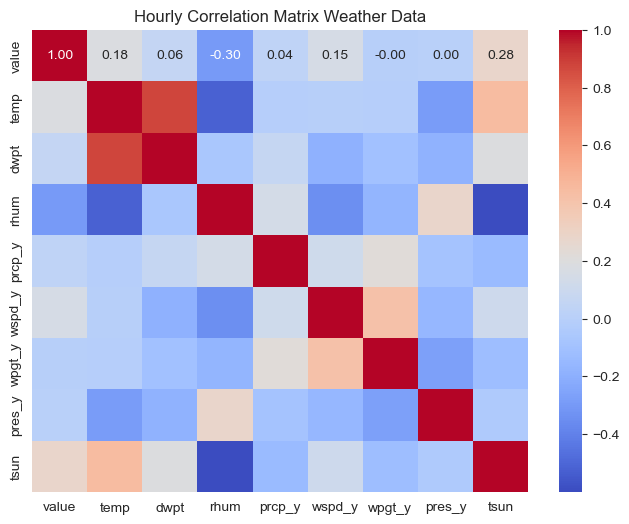

In [3]:
# First, let's select the relevant numerical columns
#'tavg', 'tmin', 'tmax', 'prcp_x', 'snow', 'wspd_x', 'wpgt_x', 'pres_x',
columns_to_correlate = ['value', 'temp', 'dwpt', 'rhum', 'prcp_y', 'wspd_y', 'wpgt_y', 'pres_y', 'tsun']

hourly_data = filtered_df.groupby('hour_timestamp')[columns_to_correlate].mean()
print(hourly_data)

# Create the correlation matrix
hourly_correlation = hourly_data.corr(numeric_only=True)

print(hourly_correlation)

print("\nCorrelations with utilization value:")
# Visualizing the Correlation Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(hourly_correlation, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Hourly Correlation Matrix Weather Data")
plt.show()


Correlations with utilization value:
           value      tavg      tmin      tmax    prcp_x      snow    wspd_x  \
value   1.000000  0.009142  0.048167 -0.004214  0.115226  0.165063 -0.057164   
tavg    0.009142  1.000000  0.959083  0.972017  0.009846 -0.347699 -0.204893   
tmin    0.048167  0.959083  1.000000  0.880445  0.134417 -0.356234 -0.221593   
tmax   -0.004214  0.972017  0.880445  1.000000 -0.094810 -0.304535 -0.197622   
prcp_x  0.115226  0.009846  0.134417 -0.094810  1.000000  0.028251  0.165497   
snow    0.165063 -0.347699 -0.356234 -0.304535  0.028251  1.000000 -0.151139   
wspd_x -0.057164 -0.204893 -0.221593 -0.197622  0.165497 -0.151139  1.000000   
wpgt_x  0.024152  0.073320  0.055847  0.073317  0.358380 -0.032988  0.483878   
pres_x  0.048551 -0.262348 -0.242224 -0.256997 -0.175954  0.017567 -0.246365   

          wpgt_x    pres_x  
value   0.024152  0.048551  
tavg    0.073320 -0.262348  
tmin    0.055847 -0.242224  
tmax    0.073317 -0.256997  
prcp_x  0.358380

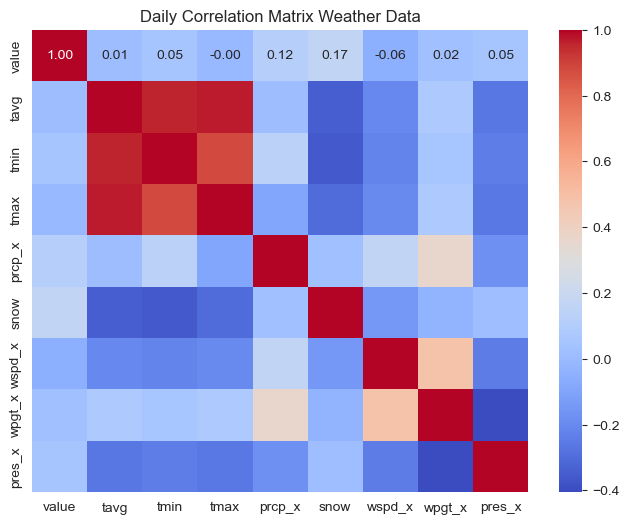

In [4]:
columns_to_correlate_day = ['value', 'tavg', 'tmin', 'tmax', 'prcp_x', 'snow', 'wspd_x', 'wpgt_x', 'pres_x']
daily_data = filtered_df.groupby('date')[columns_to_correlate_day].agg({
    'value': 'mean',
    'tavg': 'first',
    'tmin': 'first',
    'tmax': 'first',
    'prcp_x': 'first',
    'snow': 'first',
    'wspd_x': 'first',
    'wpgt_x': 'first',
    'pres_x': 'first'
}).corr(numeric_only=True)
# If you want to focus on correlations with 'value' specifically
#value_correlations_day = correlation_matrix['value'].sort_values(ascending=False)

print("\nCorrelations with utilization value:")
print(daily_data)
# Visualizing the Correlation Matrix
plt.figure(figsize=(8, 6))
sns.heatmap(daily_data, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Daily Correlation Matrix Weather Data")
plt.show()


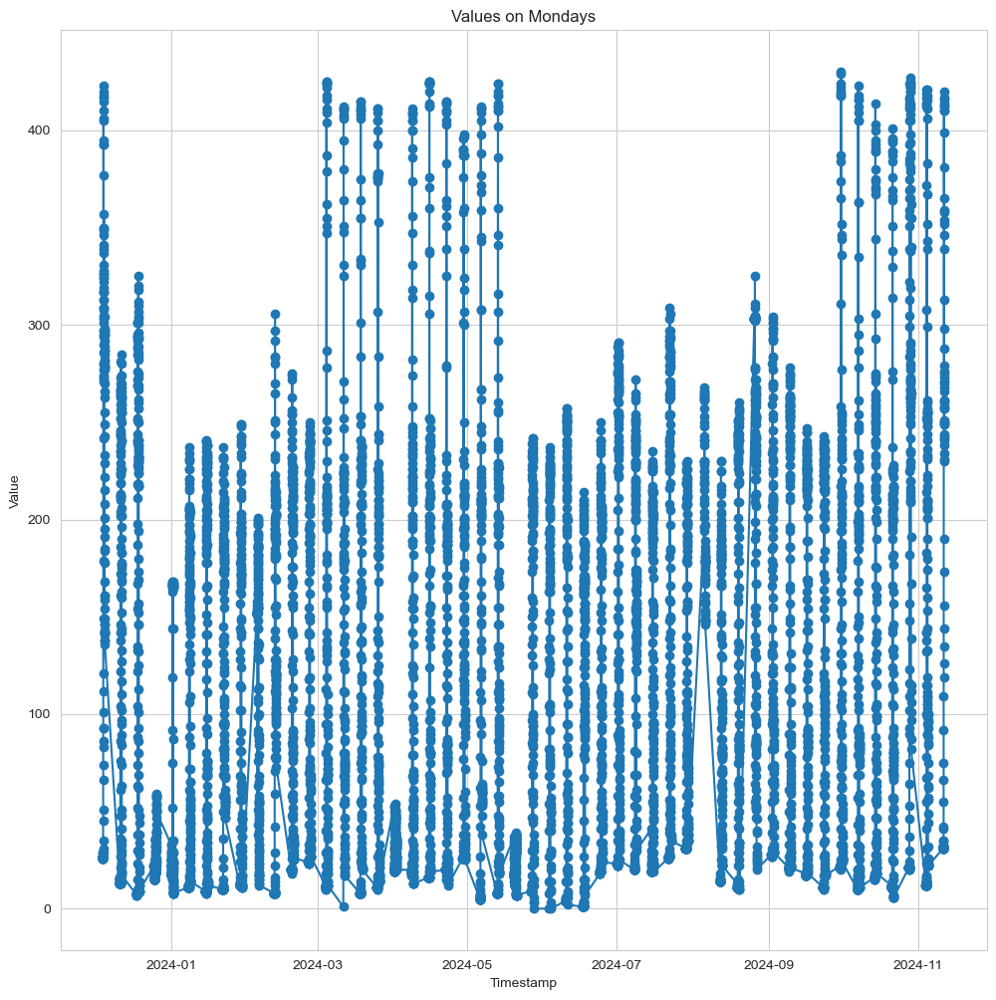

In [5]:
monday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Monday']
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(monday_df['timestamp'], monday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Mondays')
plt.grid(True)
plt.show()

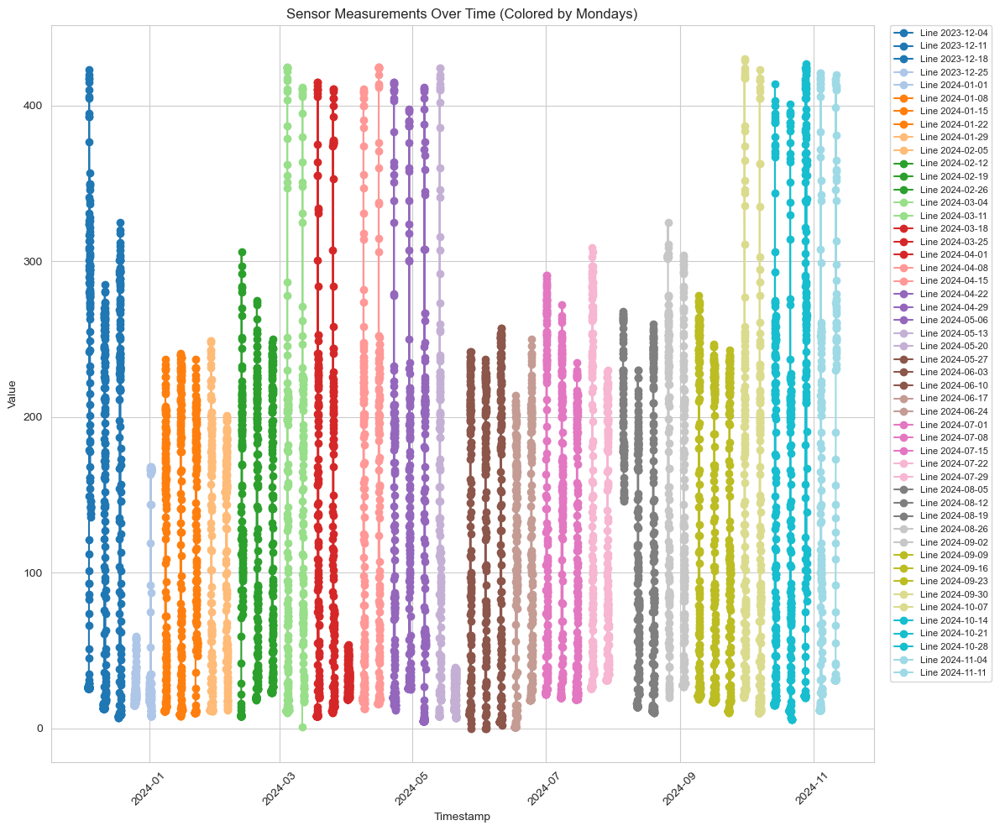

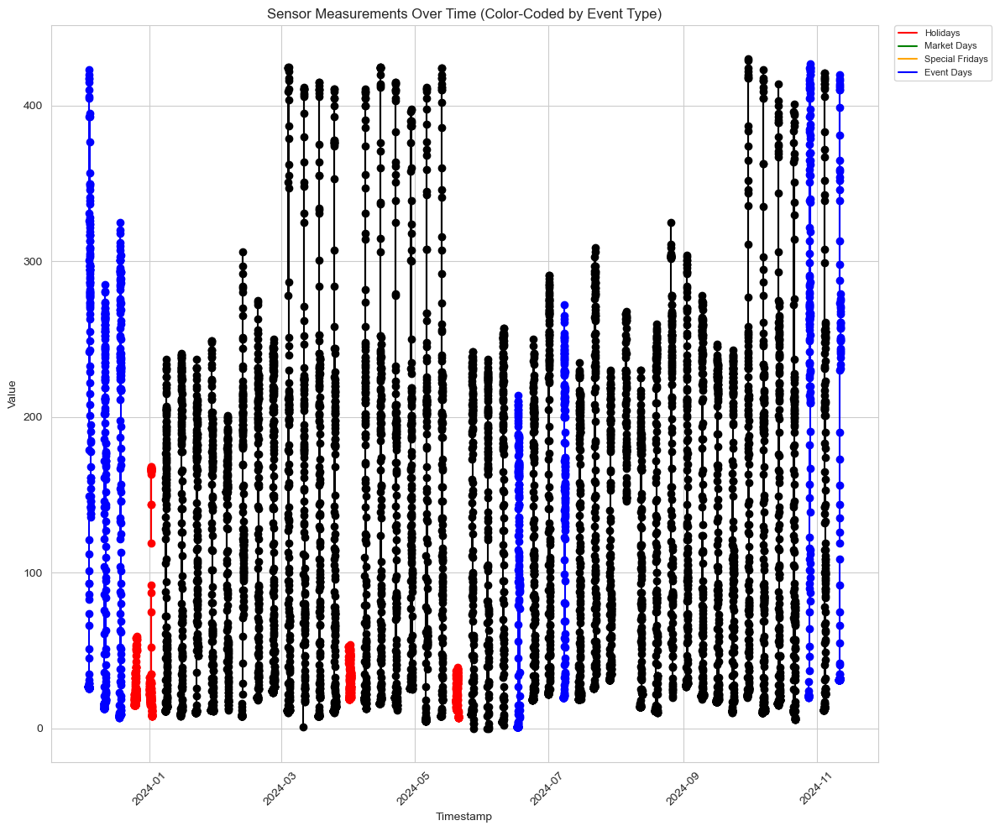

In [6]:
#monday_df.loc[:,'date'] = monday_df['timestamp'].dt.date
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = monday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(12, 10))
# Plot each line with a unique color
for i, (date, group) in enumerate(monday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by Mondays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

def get_event_color(holiday, event_name,  market_day,  special_friday):
    if pd.notna(holiday) and holiday != 0:
        return 'red'  # Holidays in red
    elif pd.notna(event_name) and event_name != 0 and market_day == 0:
        return 'blue'
    elif market_day == 1:
        return 'green'  # Market days in green
    elif special_friday == 1:
        return 'orange'  # Special Fridays in purple
    else:
        return 'black'  # Regular days in black
    
plt.figure(figsize=(12, 10))

# Create a custom color mapping
unique_dates = monday_df['hour_timestamp'].unique()
event_colors = []

for timestamp in unique_dates:
    # Find the corresponding row for this date
    event_row = monday_df[monday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row['holiday'],
        event_row['event_name'],
        event_row['market_day'], 
        event_row['special_friday']
        
    )
    event_colors.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(monday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


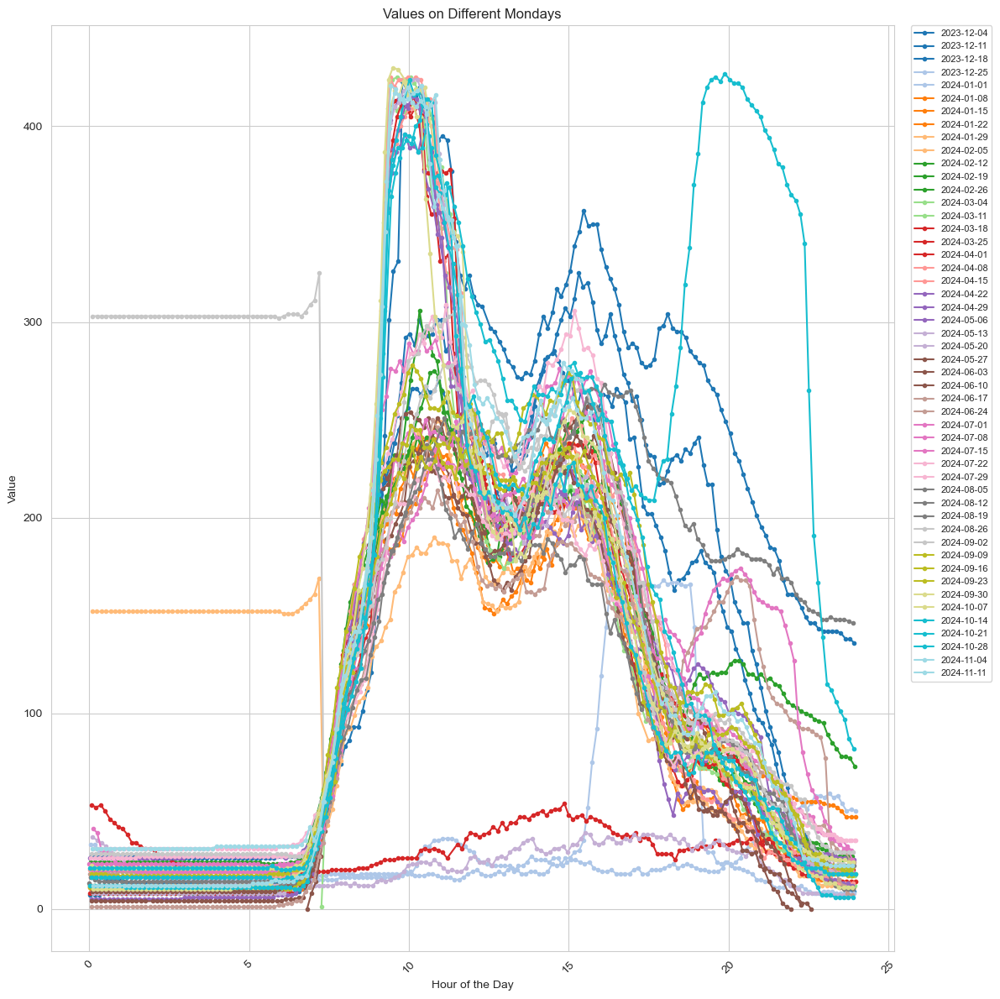

In [406]:
# Extract the date and hour from the timestamp
#monday_df.loc[:,'date'] = monday_df['timestamp'].dt.date
monday_df.loc[:,'hour'] = monday_df['timestamp'].dt.hour + monday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(monday_df.groupby('date')):
    subset = monday_df[monday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='.', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Mondays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

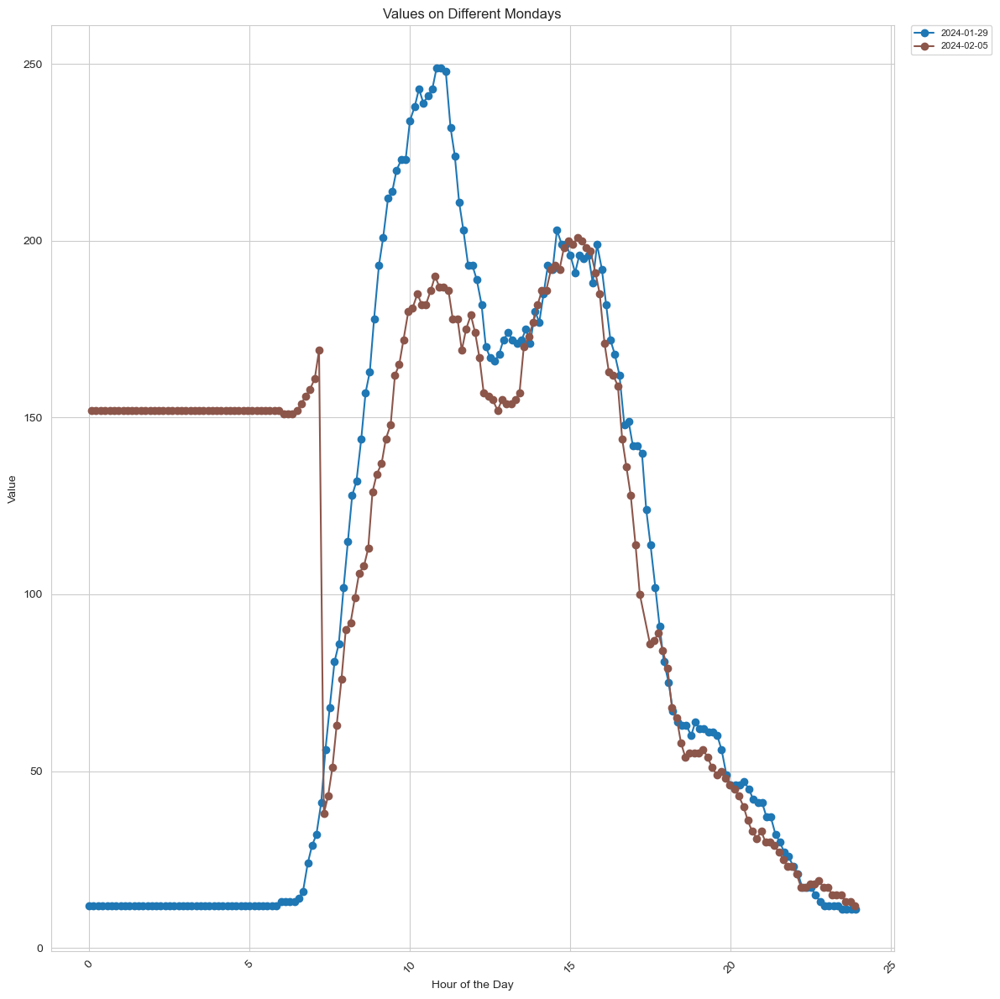

In [407]:
#df = df[(df['timestamp'] >= start_date) & (df['timestamp'] <= end_date)]
monday_df = monday_df[(monday_df['timestamp'] >= pd.to_datetime('2024-01-28')) & (monday_df['timestamp'] <= pd.to_datetime('2024-02-06'))]
scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = monday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(monday_df.groupby('date')):
    subset = monday_df[monday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Mondays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


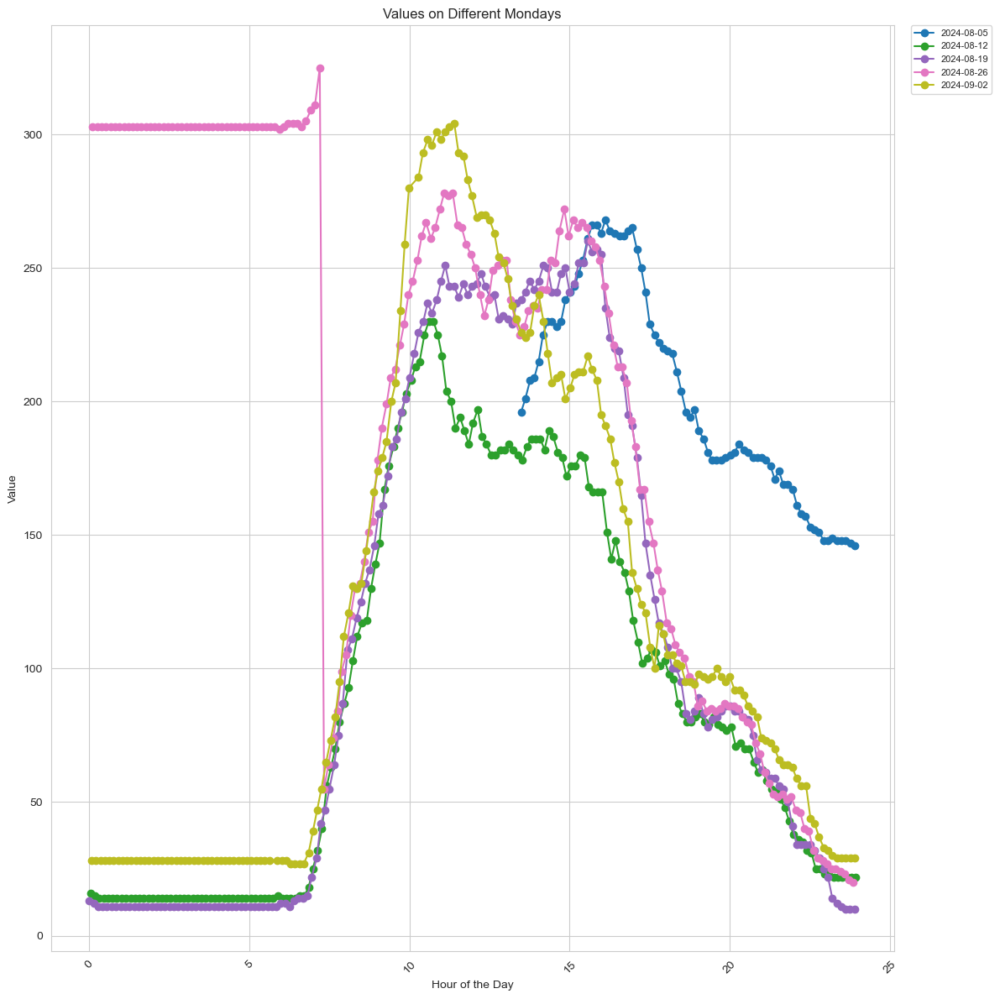

In [408]:
monday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Monday']
monday_df.loc[:,'hour'] = monday_df['timestamp'].dt.hour + monday_df['timestamp'].dt.minute / 60
monday_df = monday_df[(monday_df['timestamp'] >= pd.to_datetime('2024-08-04')) & (monday_df['timestamp'] <= pd.to_datetime('2024-09-03'))]
scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = monday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]
# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(monday_df.groupby('date')):
    subset = monday_df[monday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Mondays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
1716        utilization 2023-12-05 00:05:02    136 2023-12-05 00:00:00   
1718        utilization 2023-12-05 00:13:49    136 2023-12-05 00:00:00   
1720        utilization 2023-12-05 00:22:05    136 2023-12-05 00:00:00   
1722        utilization 2023-12-05 00:30:21    136 2023-12-05 00:00:00   
1725        utilization 2023-12-05 00:38:37    136 2023-12-05 00:00:00   
...                 ...                 ...    ...                 ...   
114143      utilization 2024-11-05 23:22:05     30 2024-11-05 23:00:00   
114145      utilization 2024-11-05 23:30:21     26 2024-11-05 23:00:00   
114146      utilization 2024-11-05 23:39:08     26 2024-11-05 23:00:00   
114149      utilization 2024-11-05 23:47:24     25 2024-11-05 23:00:00   
114150      utilization 2024-11-05 23:55:40     23 2024-11-05 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...   rhum  prcp_y  \
1716    2023-12-05     NaN   1.3  -

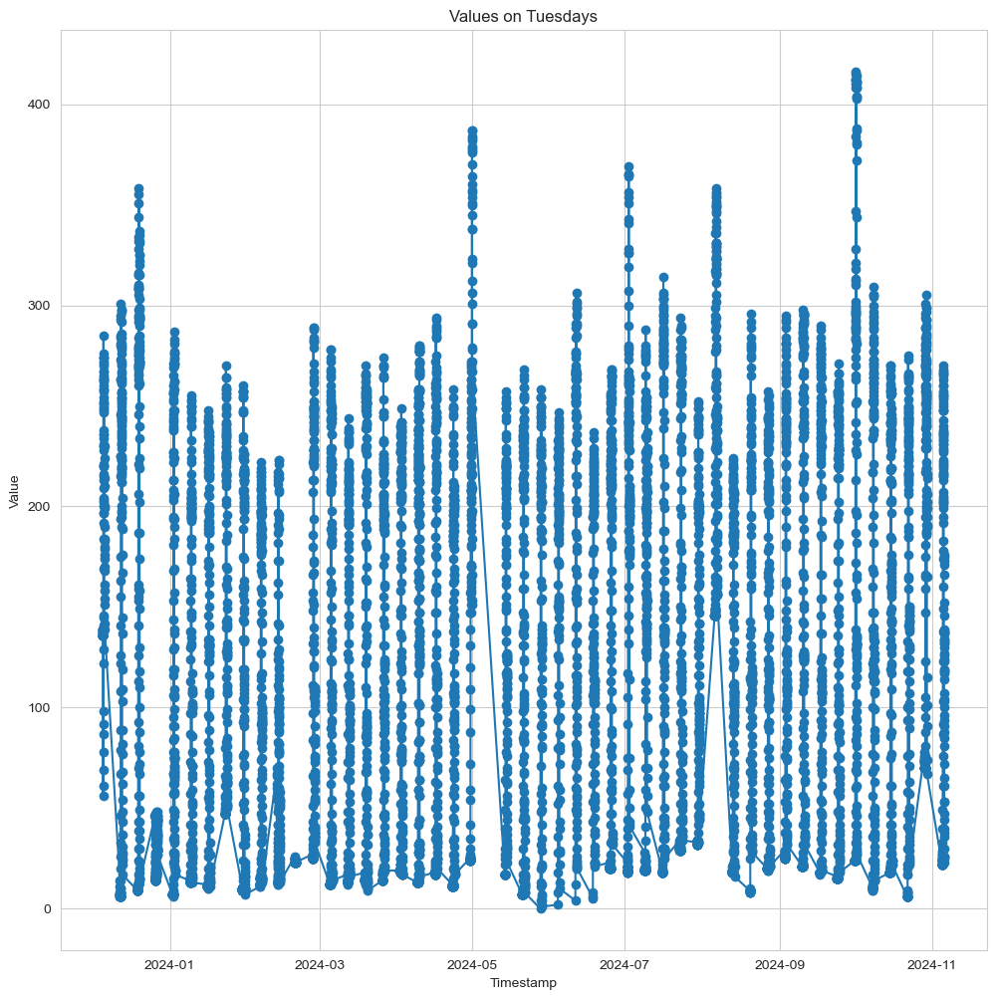

In [7]:
tuesday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Tuesday']
print(tuesday_df)
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(tuesday_df['timestamp'], tuesday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Tuesdays')
plt.grid(True)
plt.show()

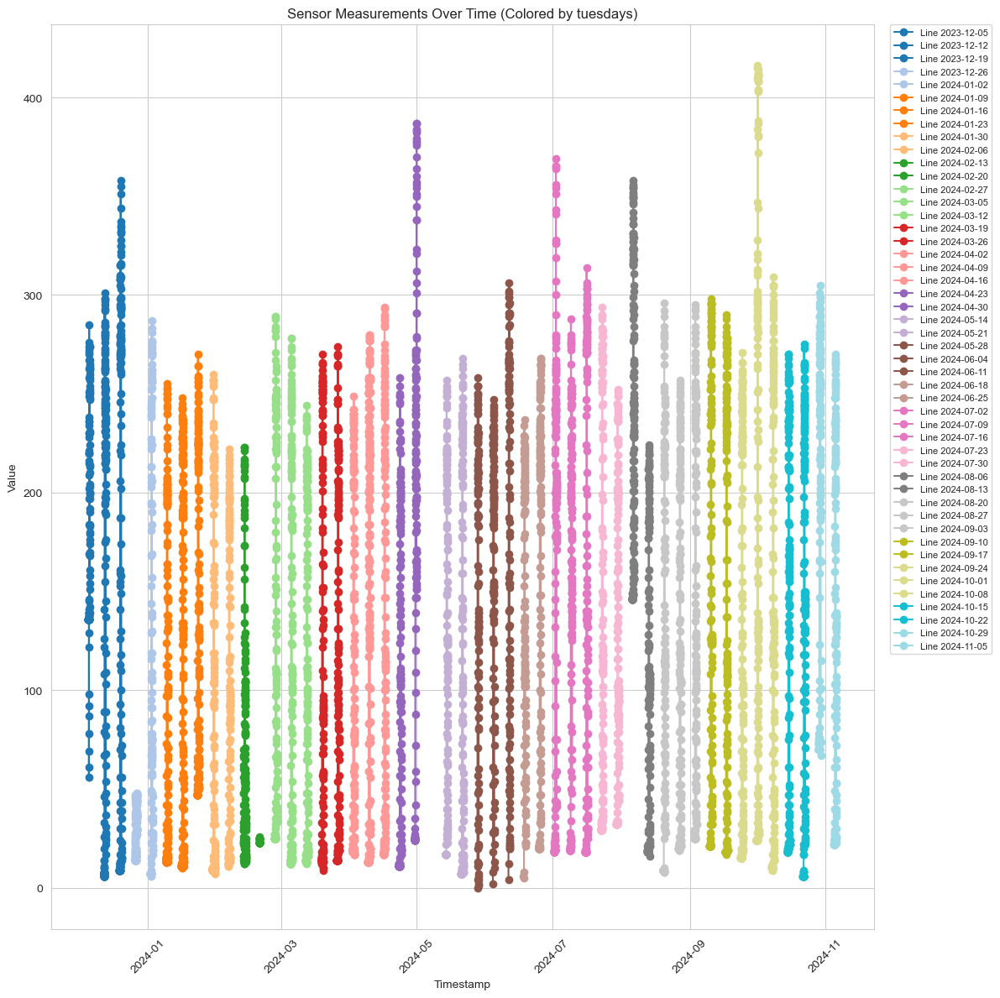

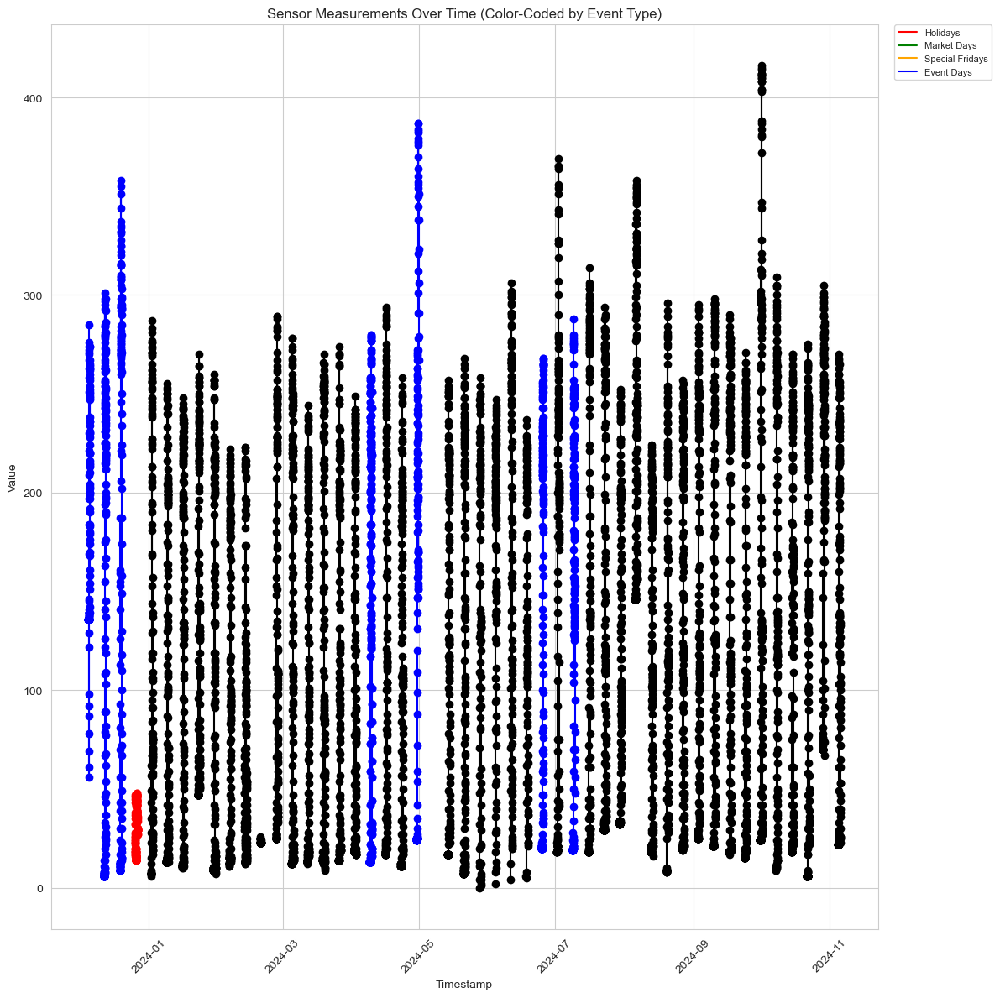

In [8]:
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = tuesday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(12, 12))
# Plot each line with a unique color
for i, (date, group) in enumerate(tuesday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by tuesdays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()
plt.figure(figsize=(12, 12))

# Create a custom color mapping
unique_dates_tuesday = tuesday_df['hour_timestamp'].unique()
event_colors_tuesday = []

for timestamp in unique_dates_tuesday:
    # Find the corresponding row for this date
    event_row = tuesday_df[tuesday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row['holiday'], 
        event_row['event_name'],
        event_row['market_day'], 
        event_row['special_friday']
        
    )
    event_colors_tuesday.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(tuesday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors_tuesday[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


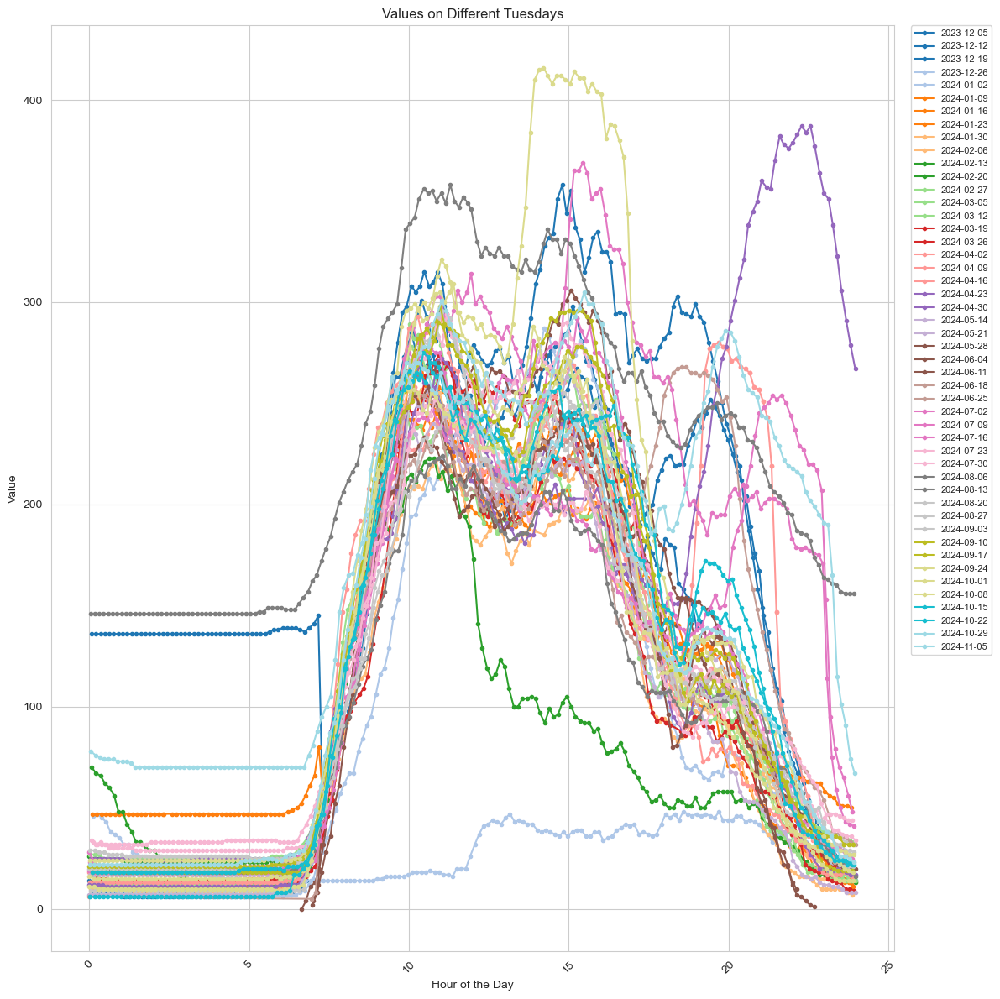

In [411]:
tuesday_df.loc[:,'hour'] = tuesday_df['timestamp'].dt.hour + tuesday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(tuesday_df.groupby('date')):
    subset = tuesday_df[tuesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='.', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Tuesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

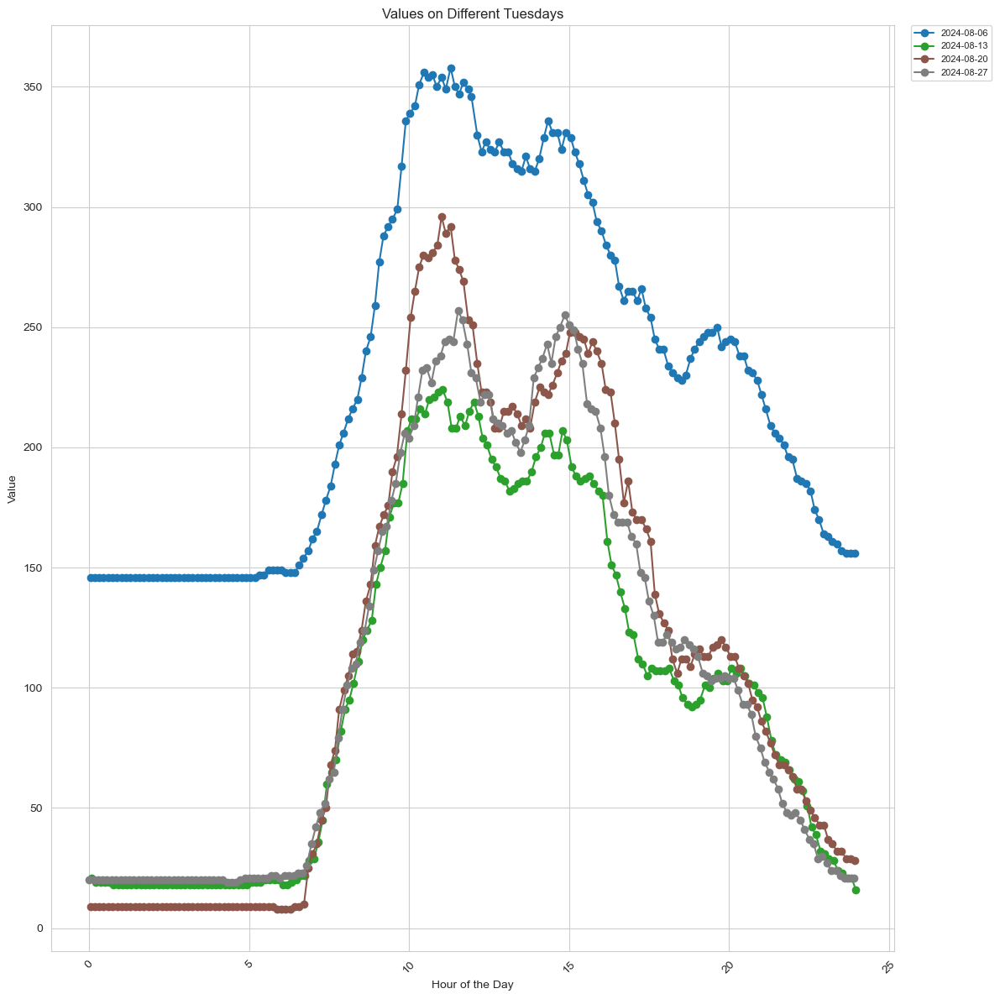

In [412]:
tuesday_df = tuesday_df[(tuesday_df['timestamp'] >= pd.to_datetime('2024-08-01')) & (tuesday_df['timestamp'] <= pd.to_datetime('2024-08-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = tuesday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(tuesday_df.groupby('date')):
    subset = tuesday_df[tuesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Tuesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
1716        utilization 2023-12-05 00:05:02    136 2023-12-05 00:00:00   
1718        utilization 2023-12-05 00:13:49    136 2023-12-05 00:00:00   
1720        utilization 2023-12-05 00:22:05    136 2023-12-05 00:00:00   
1722        utilization 2023-12-05 00:30:21    136 2023-12-05 00:00:00   
1725        utilization 2023-12-05 00:38:37    136 2023-12-05 00:00:00   
...                 ...                 ...    ...                 ...   
114143      utilization 2024-11-05 23:22:05     30 2024-11-05 23:00:00   
114145      utilization 2024-11-05 23:30:21     26 2024-11-05 23:00:00   
114146      utilization 2024-11-05 23:39:08     26 2024-11-05 23:00:00   
114149      utilization 2024-11-05 23:47:24     25 2024-11-05 23:00:00   
114150      utilization 2024-11-05 23:55:40     23 2024-11-05 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...  dwpt   rhum  \
1716    2023-12-05     NaN   1.3  -0.

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


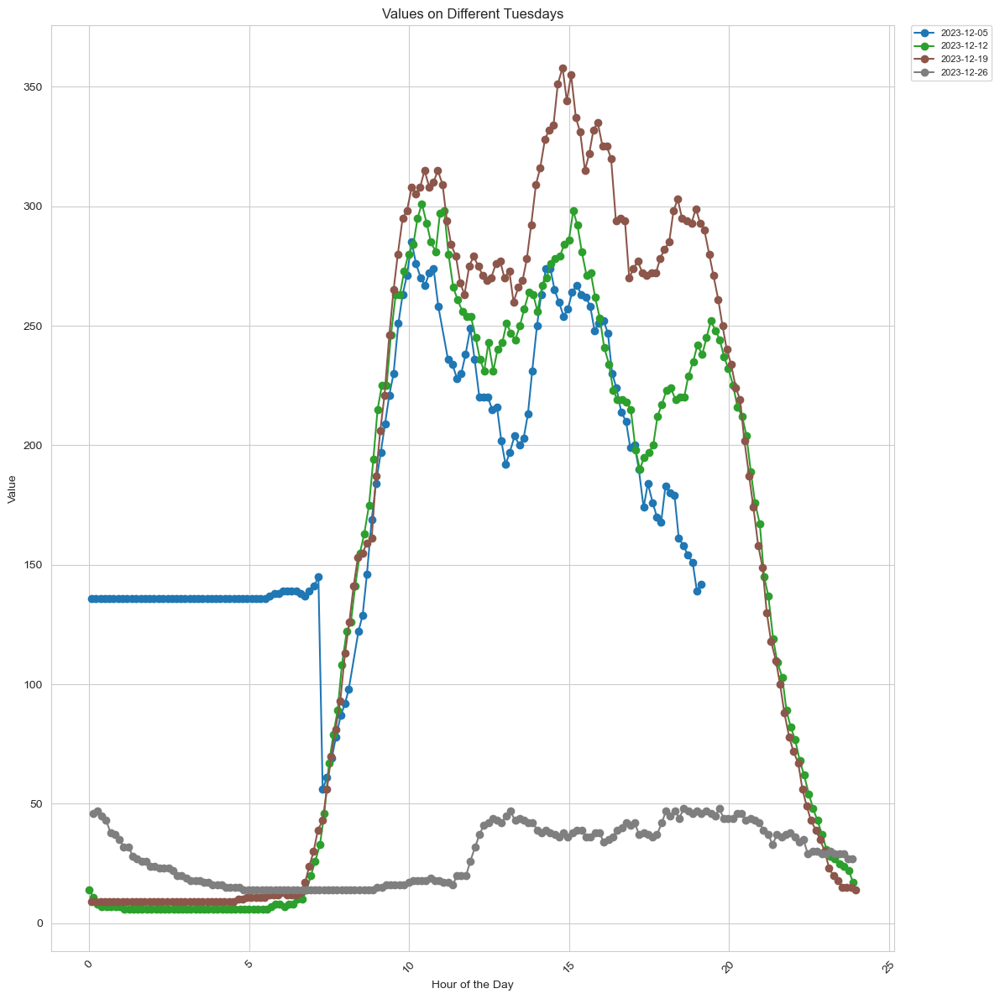

In [413]:
tuesday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Tuesday']
print(tuesday_df)
tuesday_df.loc[:,'hour'] = tuesday_df['timestamp'].dt.hour + tuesday_df['timestamp'].dt.minute / 60
tuesday_df = tuesday_df[(tuesday_df['timestamp'] >= pd.to_datetime('2023-12-01')) & (tuesday_df['timestamp'] <= pd.to_datetime('2023-12-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = tuesday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(tuesday_df.groupby('date')):
    subset = tuesday_df[tuesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Tuesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
1988        utilization 2023-12-06 07:17:09     43 2023-12-06 07:00:00   
1990        utilization 2023-12-06 07:25:25     49 2023-12-06 07:00:00   
1992        utilization 2023-12-06 07:33:41     59 2023-12-06 07:00:00   
1994        utilization 2023-12-06 07:41:57     78 2023-12-06 07:00:00   
1996        utilization 2023-12-06 07:50:13     94 2023-12-06 07:00:00   
...                 ...                 ...    ...                 ...   
114488      utilization 2024-11-06 23:24:15     37 2024-11-06 23:00:00   
114491      utilization 2024-11-06 23:32:31     35 2024-11-06 23:00:00   
114493      utilization 2024-11-06 23:41:18     34 2024-11-06 23:00:00   
114494      utilization 2024-11-06 23:49:34     32 2024-11-06 23:00:00   
114496      utilization 2024-11-06 23:57:50     29 2024-11-06 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...   rhum  prcp_y  \
1988    2023-12-06     NaN   2.2   

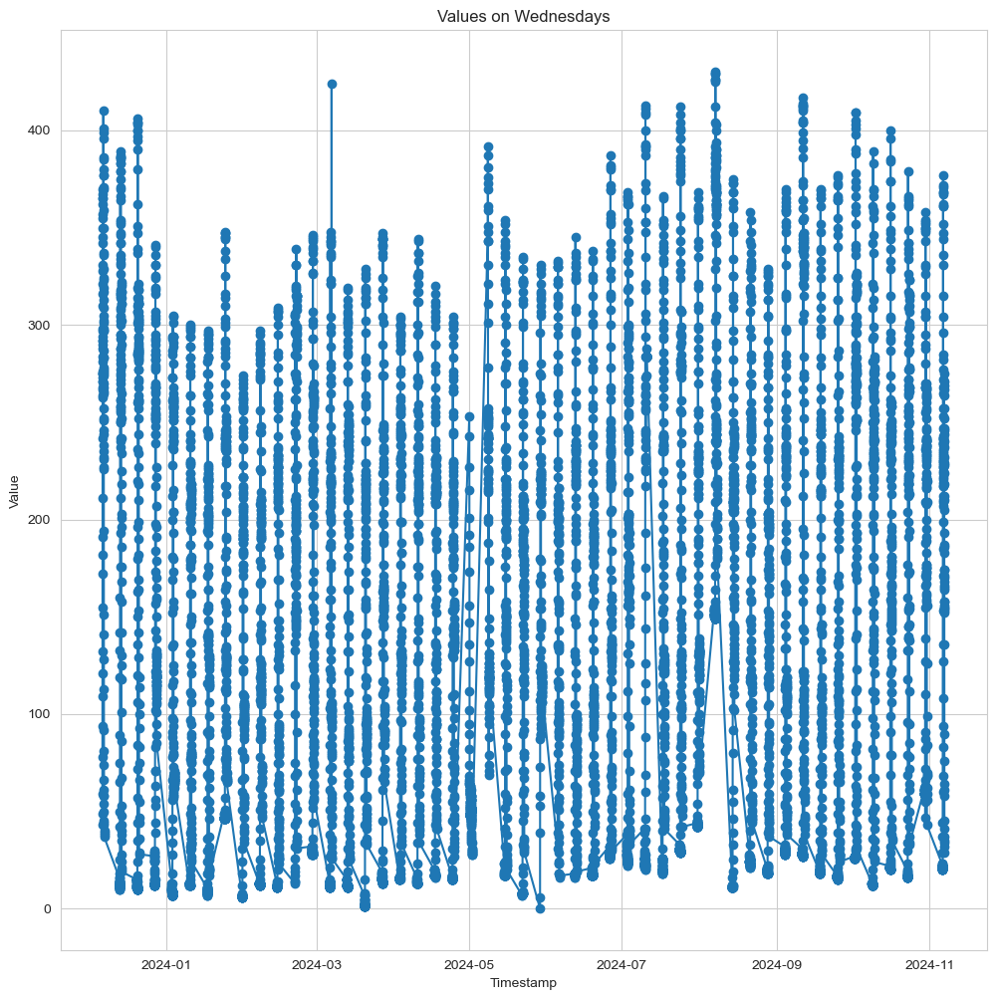

In [9]:
wednesday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Wednesday']
print(wednesday_df)
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(wednesday_df['timestamp'], wednesday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Wednesdays')
plt.grid(True)
plt.show()

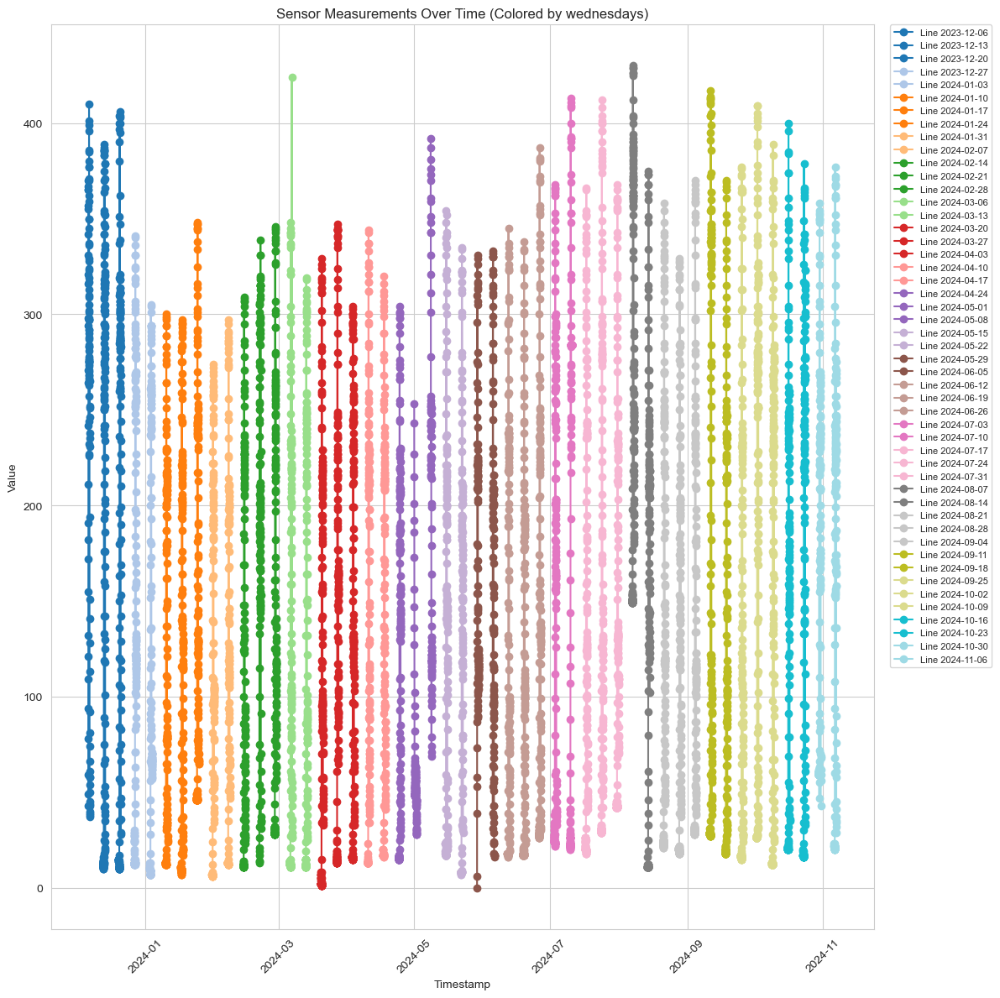

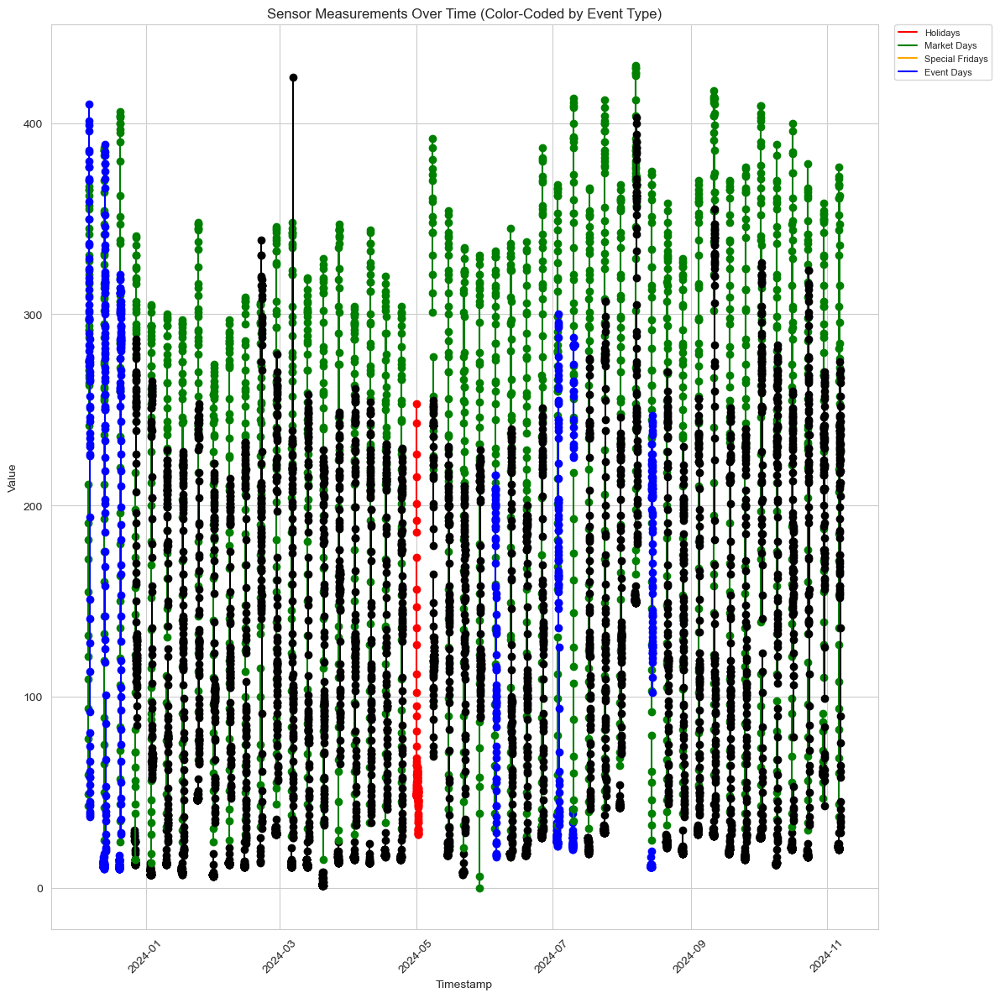

In [10]:
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = wednesday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(12, 12))
# Plot each line with a unique color
for i, (date, group) in enumerate(wednesday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by wednesdays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()
plt.figure(figsize=(12, 12))

# Create a custom color mapping
unique_dates_wednesday = wednesday_df['hour_timestamp'].unique()
event_colors_wednesday = []

for timestamp in unique_dates_wednesday:
    # Find the corresponding row for this date
    event_row_wednesday = wednesday_df[wednesday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row_wednesday['holiday'],
        event_row_wednesday['event_name'],
        event_row_wednesday['market_day'],
        event_row_wednesday['special_friday']
        
    )
    event_colors_wednesday.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(wednesday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors_wednesday[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


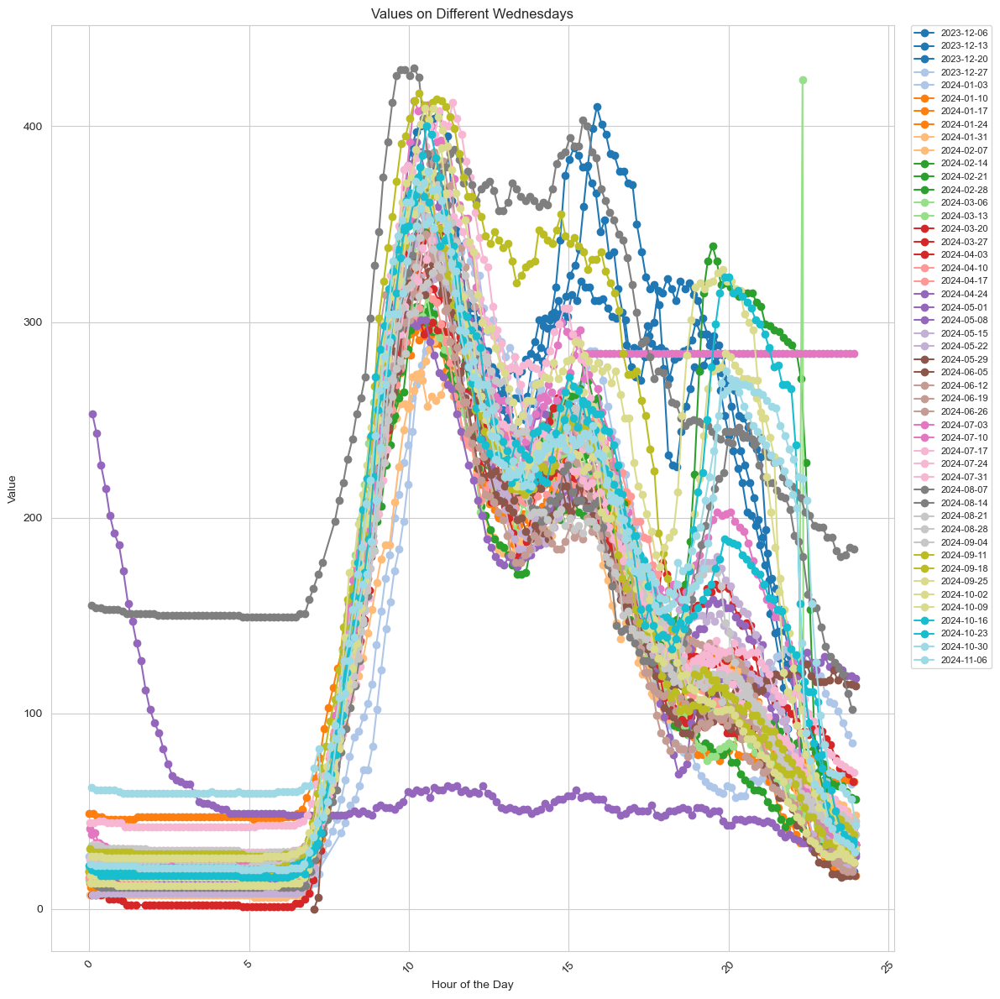

In [422]:
wednesday_df.loc[:,'hour'] = wednesday_df['timestamp'].dt.hour + wednesday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(wednesday_df.groupby('date')):
    subset = wednesday_df[wednesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Wednesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

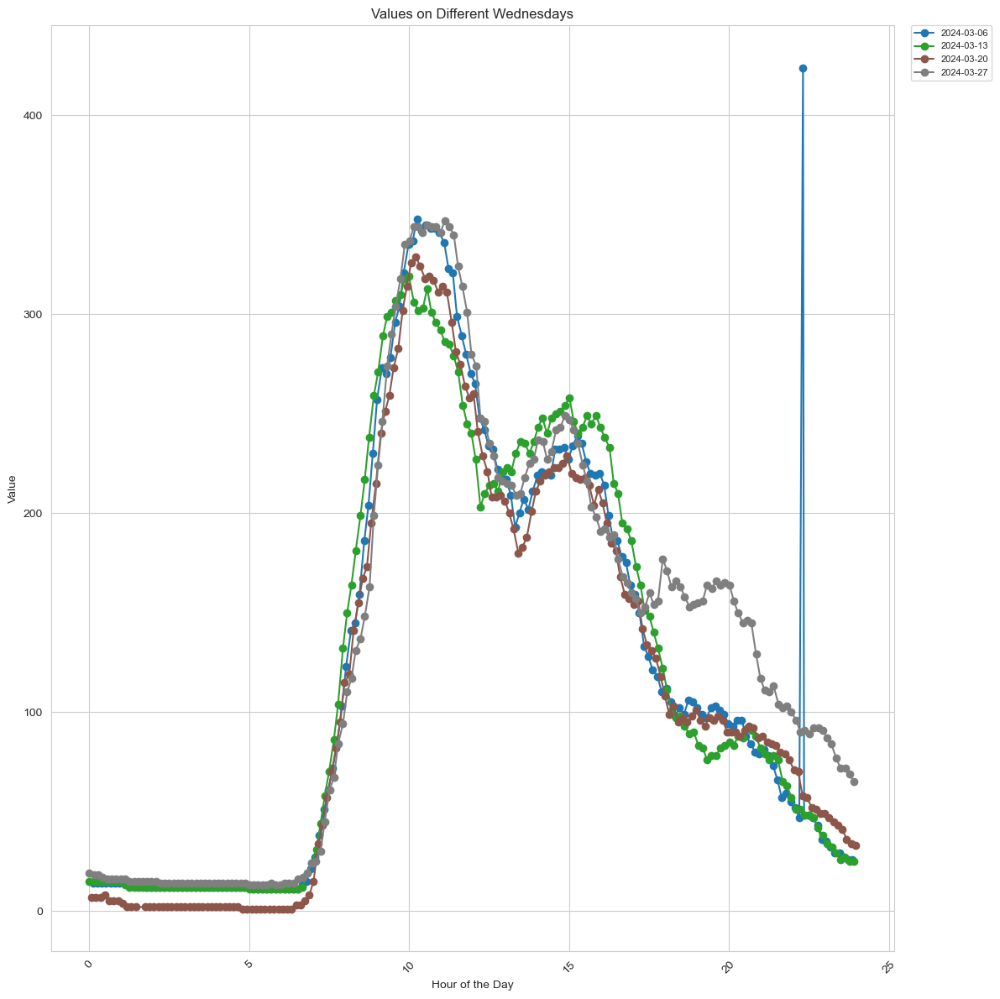

In [423]:
wednesday_df = wednesday_df[(wednesday_df['timestamp'] >= pd.to_datetime('2024-03-01')) & (
            wednesday_df['timestamp'] <= pd.to_datetime('2024-03-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = wednesday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(wednesday_df.groupby('date')):
    subset = wednesday_df[wednesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Wednesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


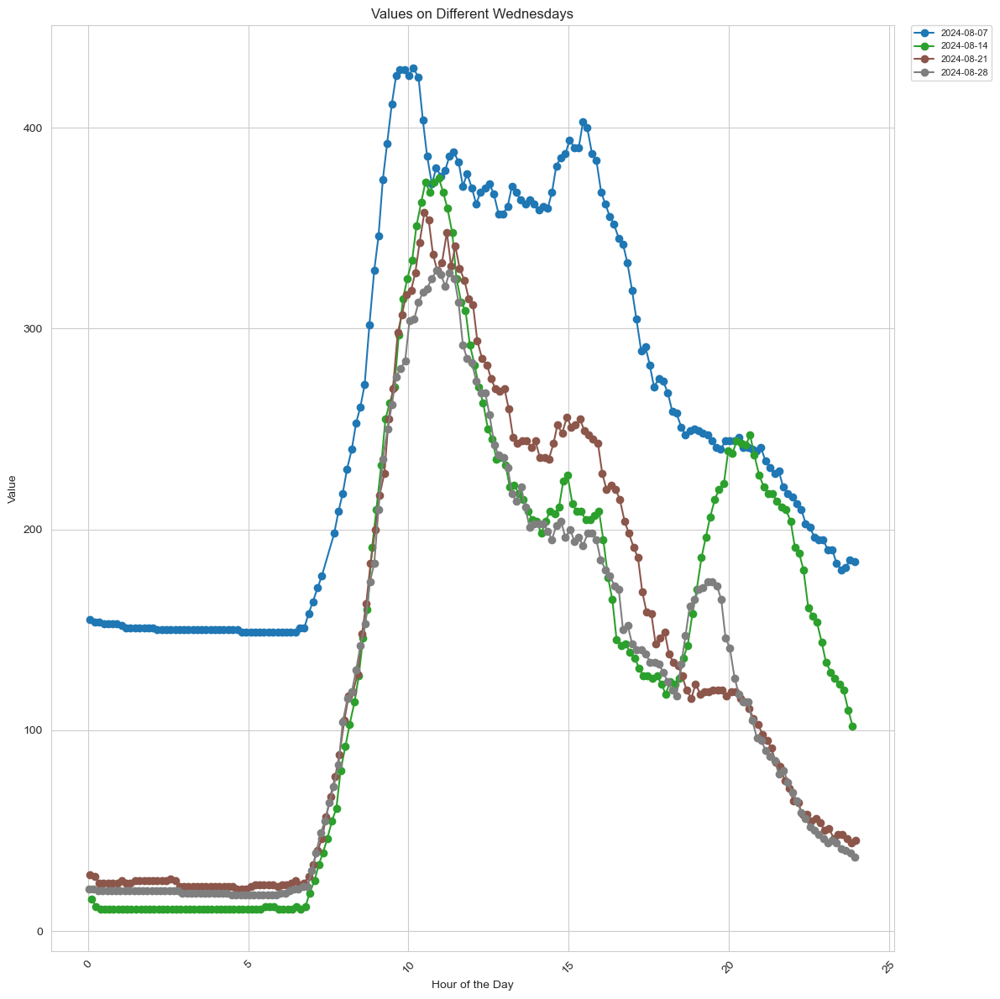

In [424]:
wednesday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Wednesday']
wednesday_df.loc[:, 'hour'] = wednesday_df['timestamp'].dt.hour + wednesday_df['timestamp'].dt.minute / 60
wednesday_df = wednesday_df[(wednesday_df['timestamp'] >= pd.to_datetime('2024-08-01')) & (
            wednesday_df['timestamp'] <= pd.to_datetime('2024-08-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = wednesday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(wednesday_df.groupby('date')):
    subset = wednesday_df[wednesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Wednesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


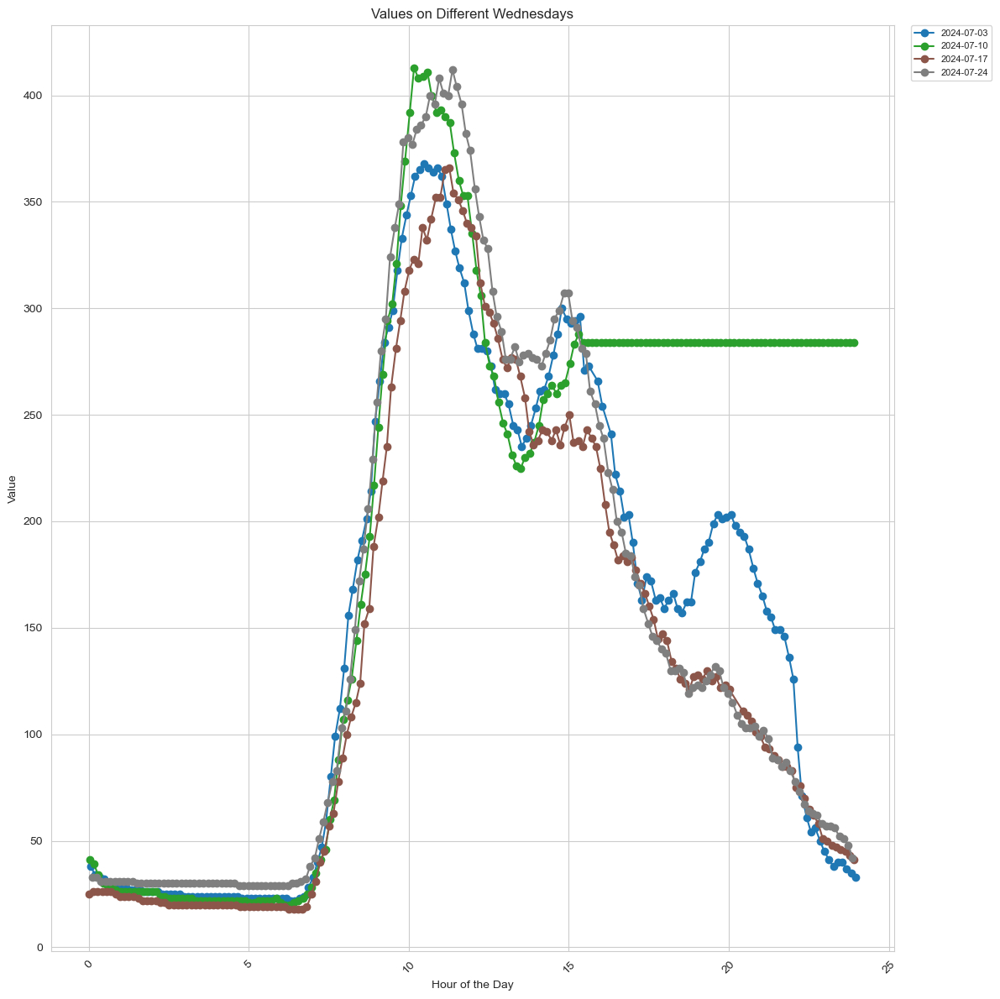

In [425]:
wednesday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Wednesday']
wednesday_df.loc[:, 'hour'] = wednesday_df['timestamp'].dt.hour + wednesday_df['timestamp'].dt.minute / 60
wednesday_df = wednesday_df[(wednesday_df['timestamp'] >= pd.to_datetime('2024-07-01')) & (
            wednesday_df['timestamp'] <= pd.to_datetime('2024-07-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = wednesday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(wednesday_df.groupby('date')):
    subset = wednesday_df[wednesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Wednesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


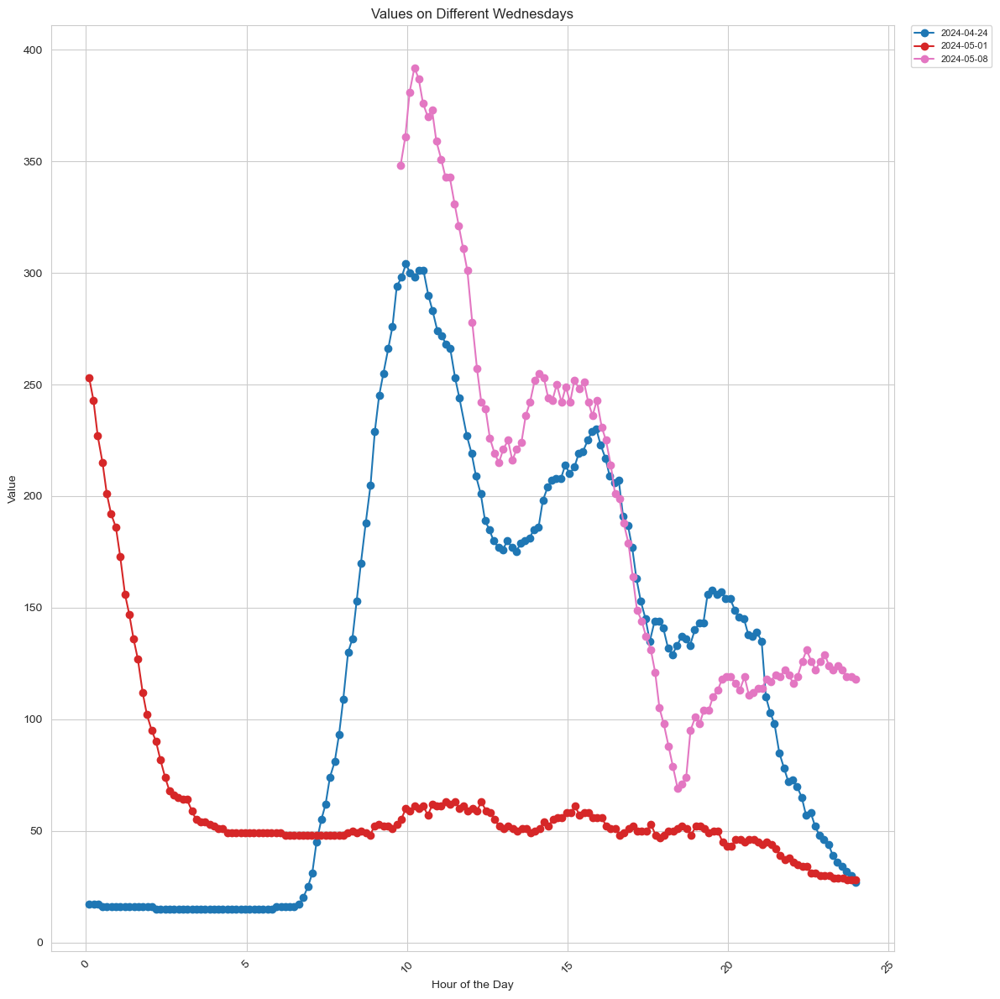

In [11]:
wednesday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Wednesday']
wednesday_df.loc[:, 'hour'] = wednesday_df['timestamp'].dt.hour + wednesday_df['timestamp'].dt.minute / 60
wednesday_df = wednesday_df[(wednesday_df['timestamp'] >= pd.to_datetime('2024-04-23')) & (
            wednesday_df['timestamp'] <= pd.to_datetime('2024-05-09'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = wednesday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(wednesday_df.groupby('date')):
    subset = wednesday_df[wednesday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Wednesdays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
0           utilization 2023-11-30 00:05:12     97 2023-11-30 00:00:00   
2           utilization 2023-11-30 00:13:28     94 2023-11-30 00:00:00   
4           utilization 2023-11-30 00:22:15     94 2023-11-30 00:00:00   
6           utilization 2023-11-30 00:30:31     94 2023-11-30 00:00:00   
9           utilization 2023-11-30 00:38:47     93 2023-11-30 00:00:00   
...                 ...                 ...    ...                 ...   
114835      utilization 2024-11-07 23:26:39     35 2024-11-07 23:00:00   
114836      utilization 2024-11-07 23:34:55     33 2024-11-07 23:00:00   
114838      utilization 2024-11-07 23:43:11     33 2024-11-07 23:00:00   
114840      utilization 2024-11-07 23:51:27     31 2024-11-07 23:00:00   
114843      utilization 2024-11-07 23:59:43     31 2024-11-07 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...  rhum  prcp_y  \
0       2023-11-30     NaN   0.8  -1

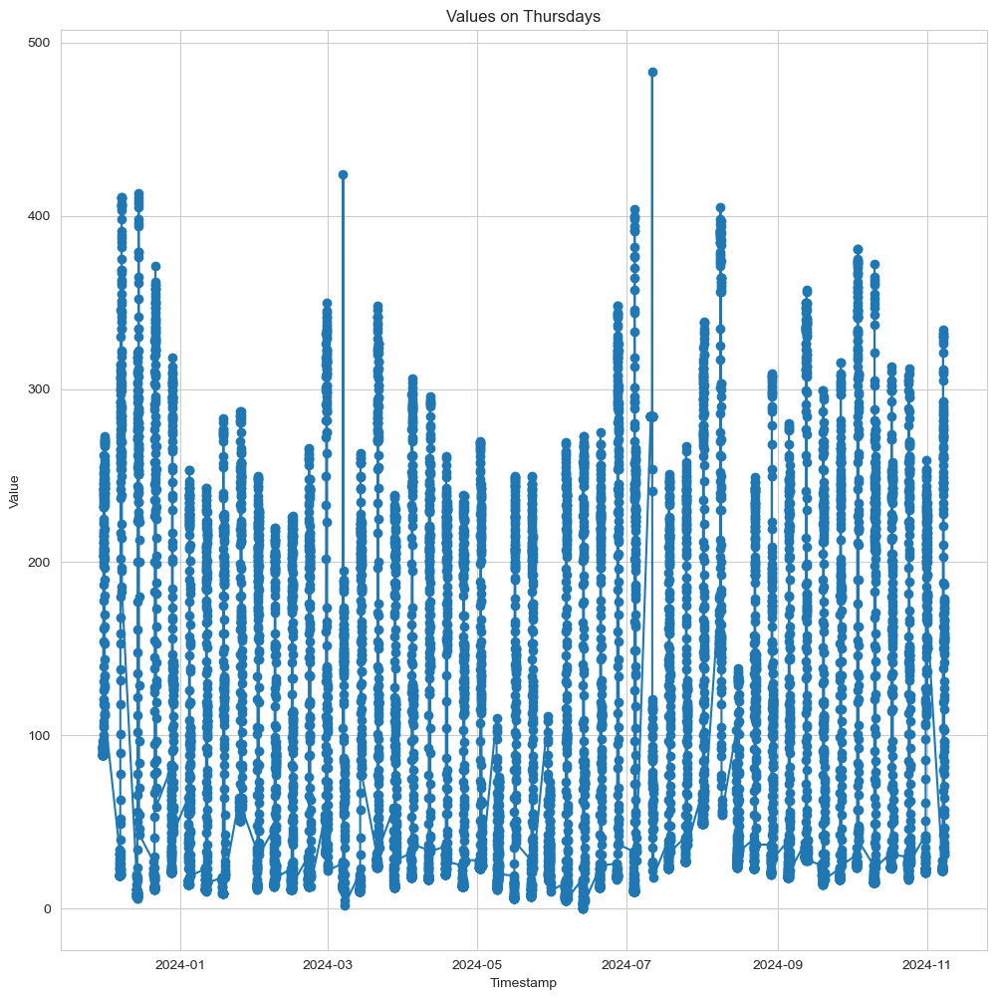

In [12]:
thursday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Thursday']
print(thursday_df)
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(thursday_df['timestamp'], thursday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Thursdays')
plt.grid(True)
plt.show()

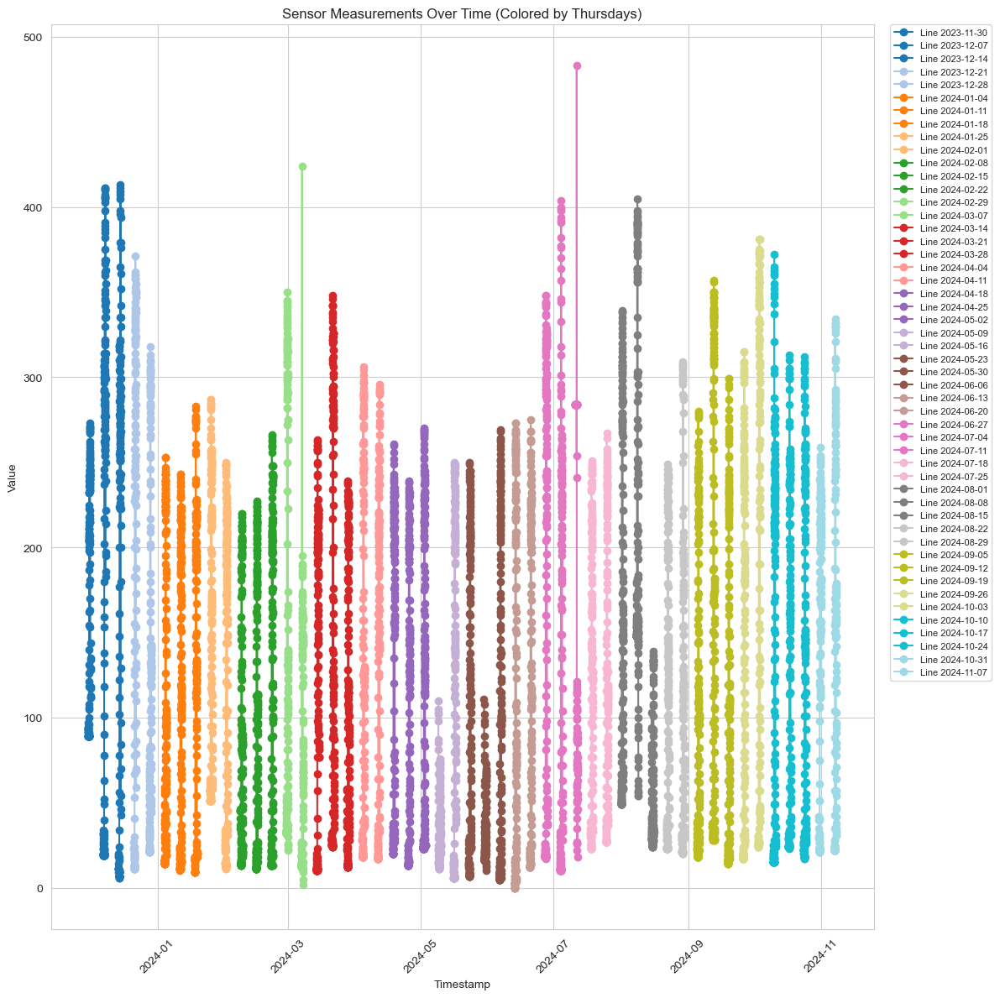

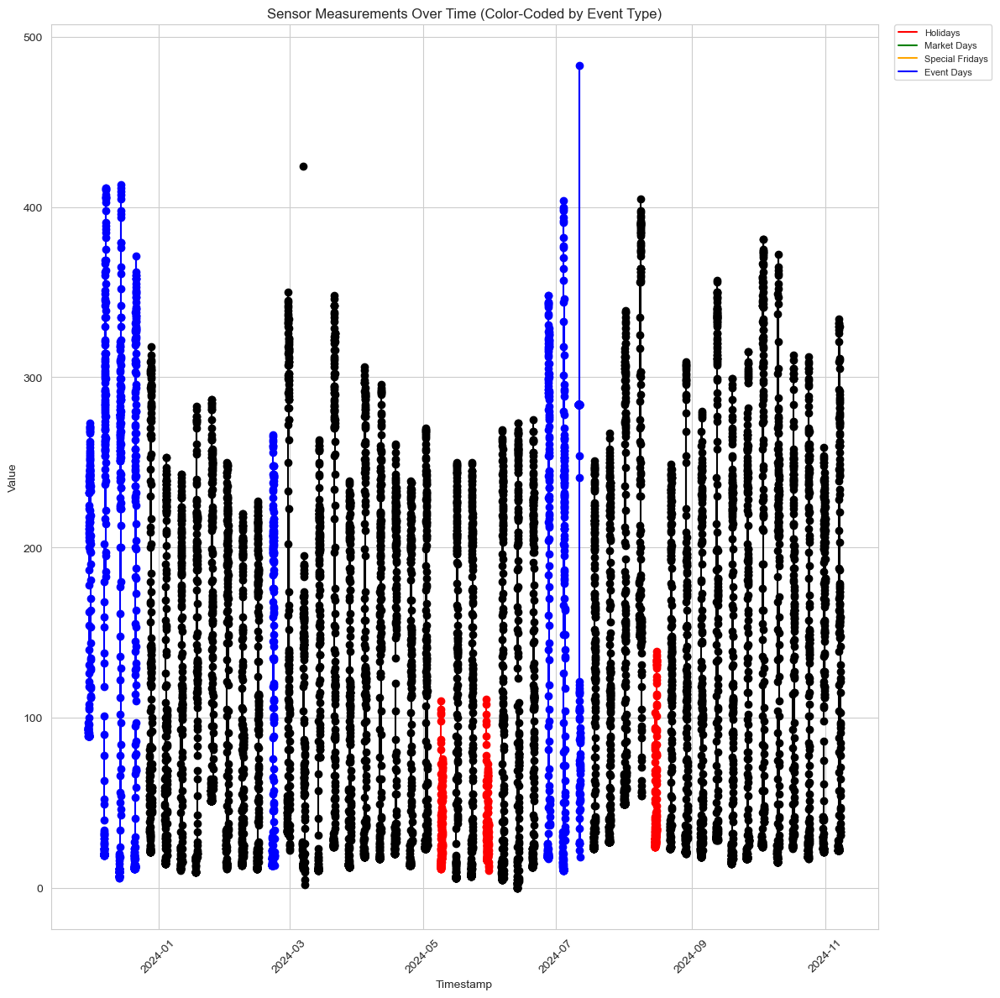

In [13]:
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = thursday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(12, 12))
# Plot each line with a unique color
for i, (date, group) in enumerate(thursday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by Thursdays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()
plt.figure(figsize=(12, 12))

# Create a custom color mapping
unique_dates_thursday = thursday_df['hour_timestamp'].unique()
event_colors_thursday = []

for timestamp in unique_dates_thursday:
    # Find the corresponding row for this date
    event_row_thursday = thursday_df[thursday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row_thursday['holiday'],
        event_row_thursday['event_name'],
        event_row_thursday['market_day'],
        event_row_thursday['special_friday']
        
    )
    event_colors_thursday.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(thursday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors_thursday[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


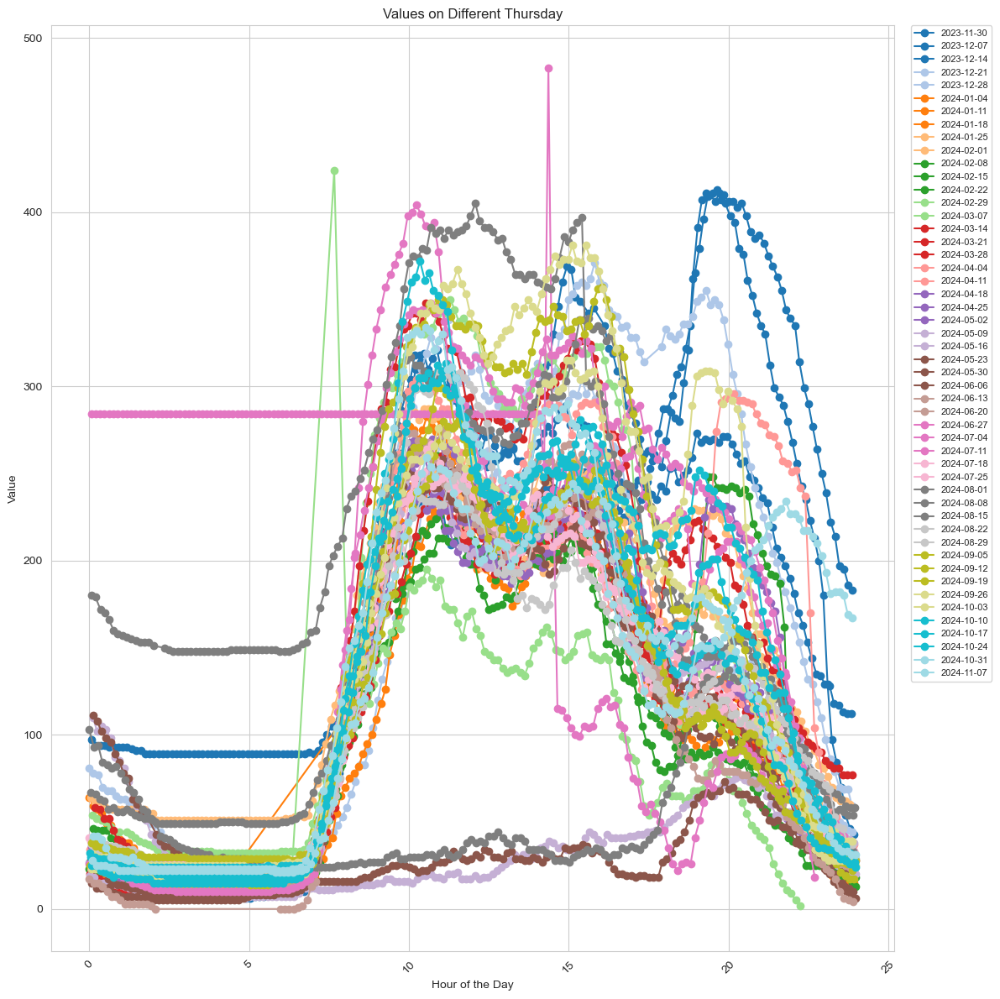

In [430]:
thursday_df.loc[:,'hour'] = thursday_df['timestamp'].dt.hour + thursday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(thursday_df.groupby('date')):
    subset = thursday_df[thursday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Thursday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

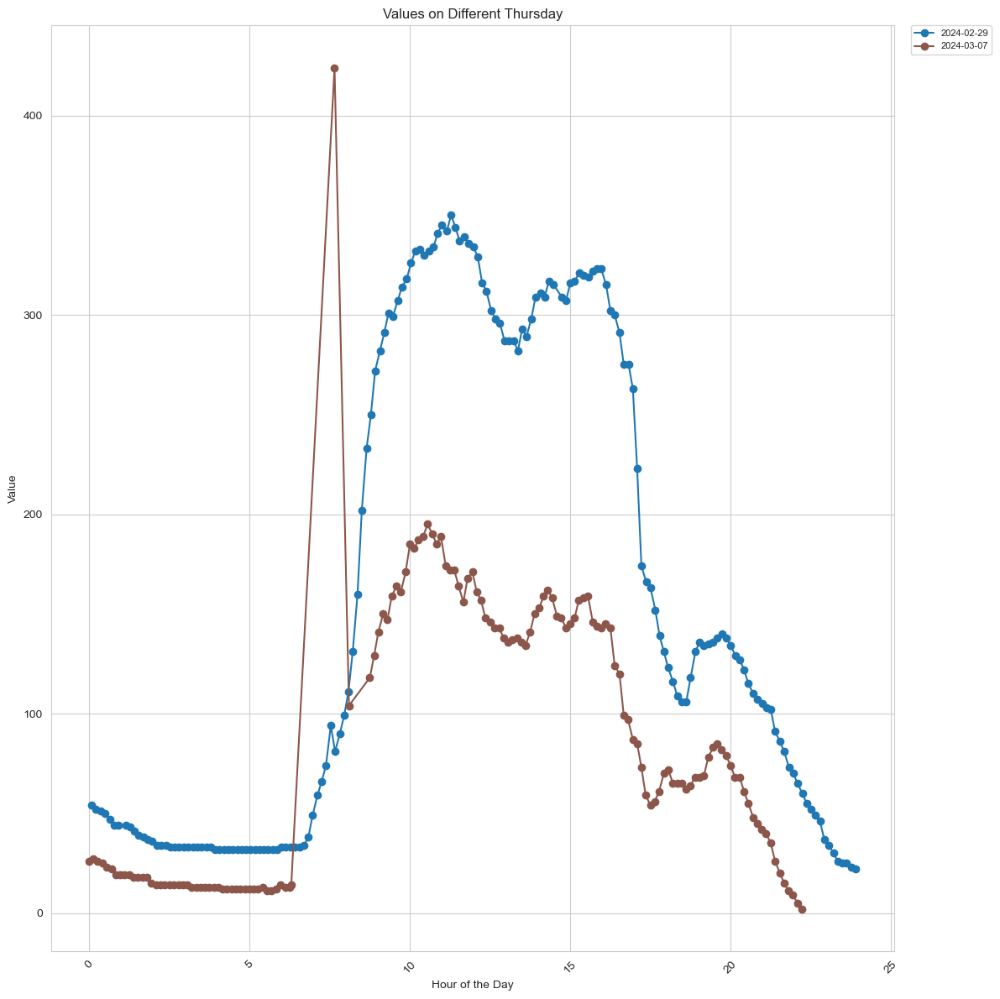

In [431]:
thursday_df = thursday_df[(thursday_df['timestamp'] >= pd.to_datetime('2024-02-28')) & (
            thursday_df['timestamp'] <= pd.to_datetime('2024-03-08'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = thursday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(thursday_df.groupby('date')):
    subset = thursday_df[thursday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Thursday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


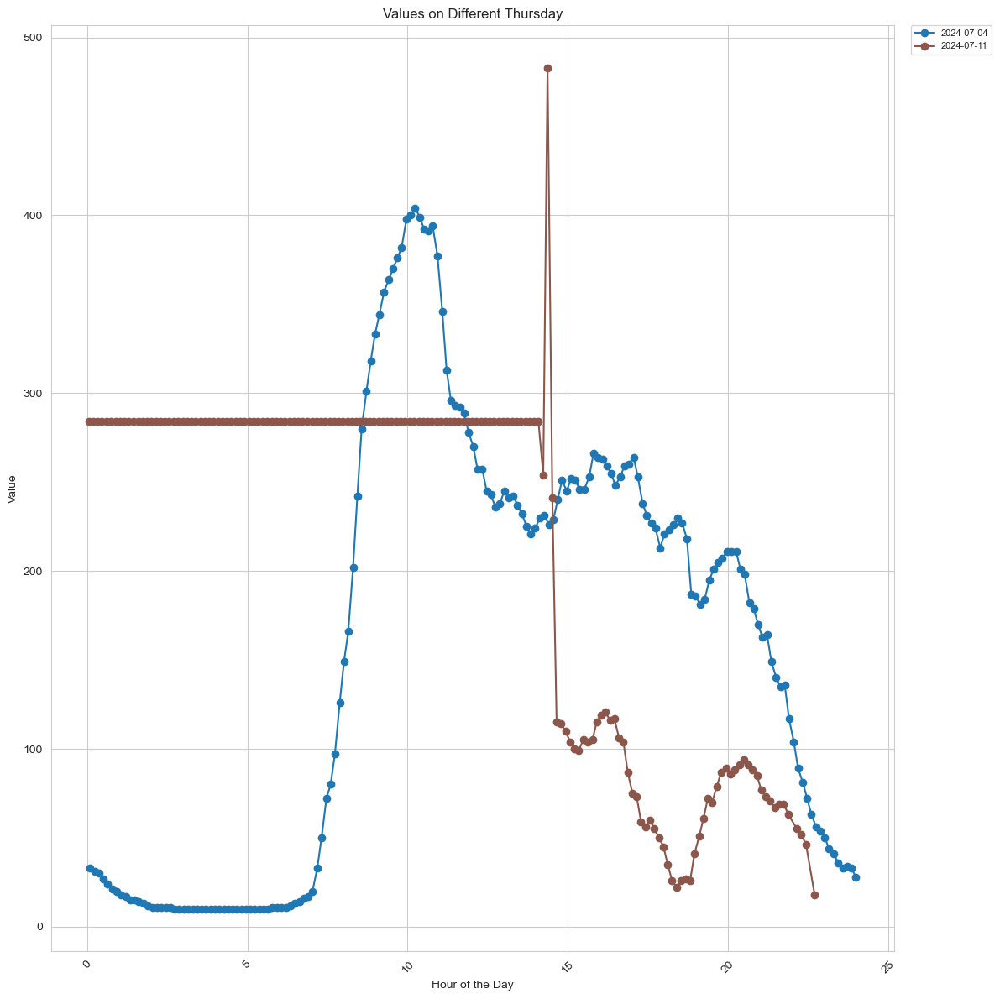

In [434]:
thursday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Thursday']
thursday_df.loc[:, 'hour'] = thursday_df['timestamp'].dt.hour + thursday_df['timestamp'].dt.minute / 60
thursday_df = thursday_df[(thursday_df['timestamp'] >= pd.to_datetime('2024-07-01')) & (
            thursday_df['timestamp'] <= pd.to_datetime('2024-07-15'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = thursday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(thursday_df.groupby('date')):
    subset = thursday_df[thursday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Thursday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


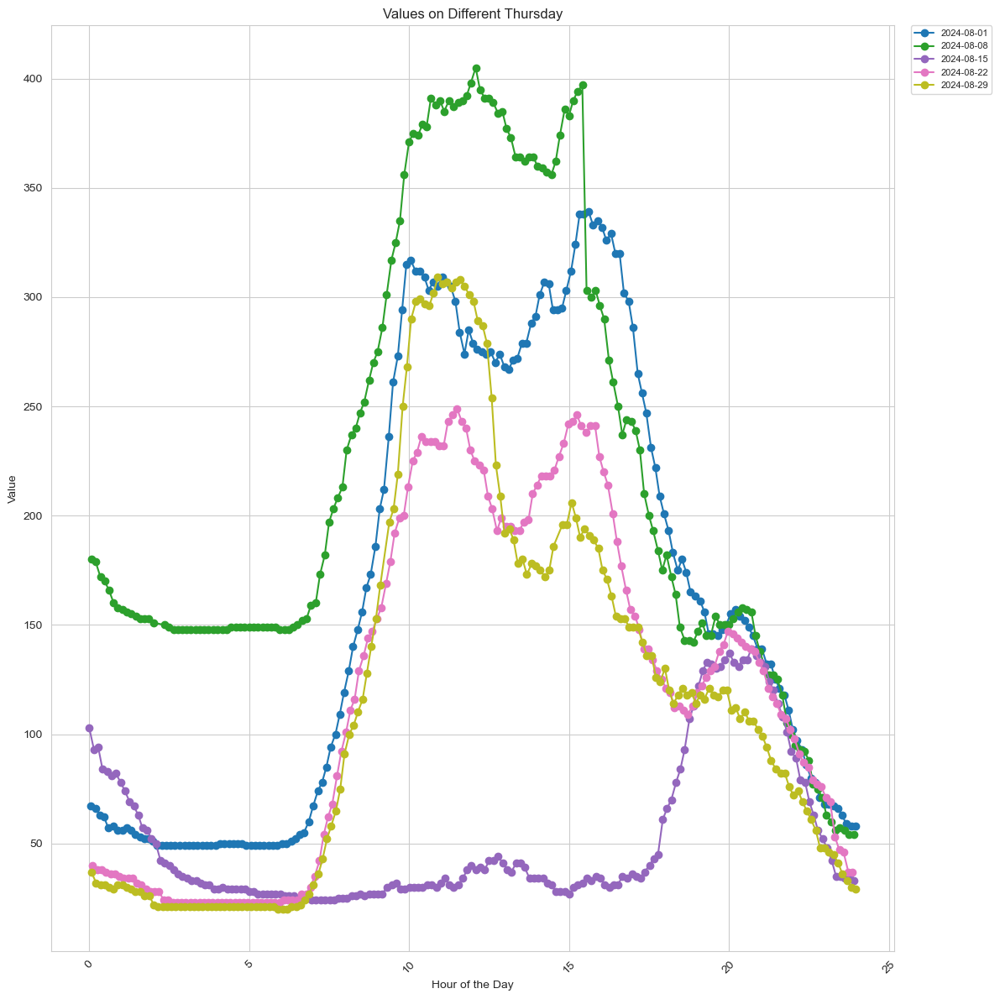

In [435]:
thursday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Thursday']
thursday_df.loc[:, 'hour'] = thursday_df['timestamp'].dt.hour + thursday_df['timestamp'].dt.minute / 60
thursday_df = thursday_df[(thursday_df['timestamp'] >= pd.to_datetime('2024-08-01')) & (
            thursday_df['timestamp'] <= pd.to_datetime('2024-08-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = thursday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(thursday_df.groupby('date')):
    subset = thursday_df[thursday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Thursday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
339         utilization 2023-12-01 00:00:09    112 2023-12-01 00:00:00   
340         utilization 2023-12-01 00:08:25    112 2023-12-01 00:00:00   
342         utilization 2023-12-01 00:16:41    111 2023-12-01 00:00:00   
344         utilization 2023-12-01 00:25:28    110 2023-12-01 00:00:00   
347         utilization 2023-12-01 00:33:44    106 2023-12-01 00:00:00   
...                 ...                 ...    ...                 ...   
115178      utilization 2024-11-08 23:20:15    160 2024-11-08 23:00:00   
115180      utilization 2024-11-08 23:28:31    155 2024-11-08 23:00:00   
115182      utilization 2024-11-08 23:36:47    147 2024-11-08 23:00:00   
115184      utilization 2024-11-08 23:45:03    140 2024-11-08 23:00:00   
115187      utilization 2024-11-08 23:53:50    131 2024-11-08 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...  rhum  prcp_y  \
339     2023-12-01     NaN   2.8   0

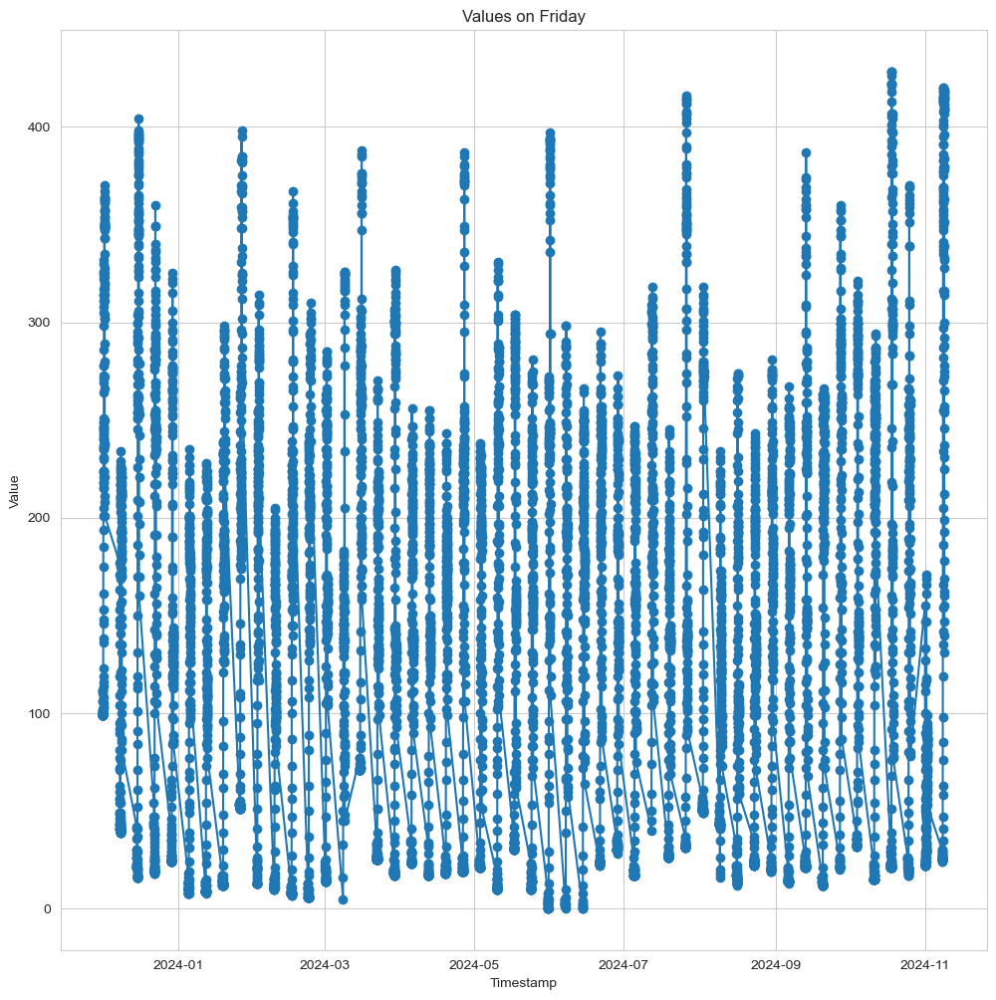

In [14]:
friday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Friday']
print(friday_df)
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(friday_df['timestamp'], friday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Friday')
plt.grid(True)
plt.show()

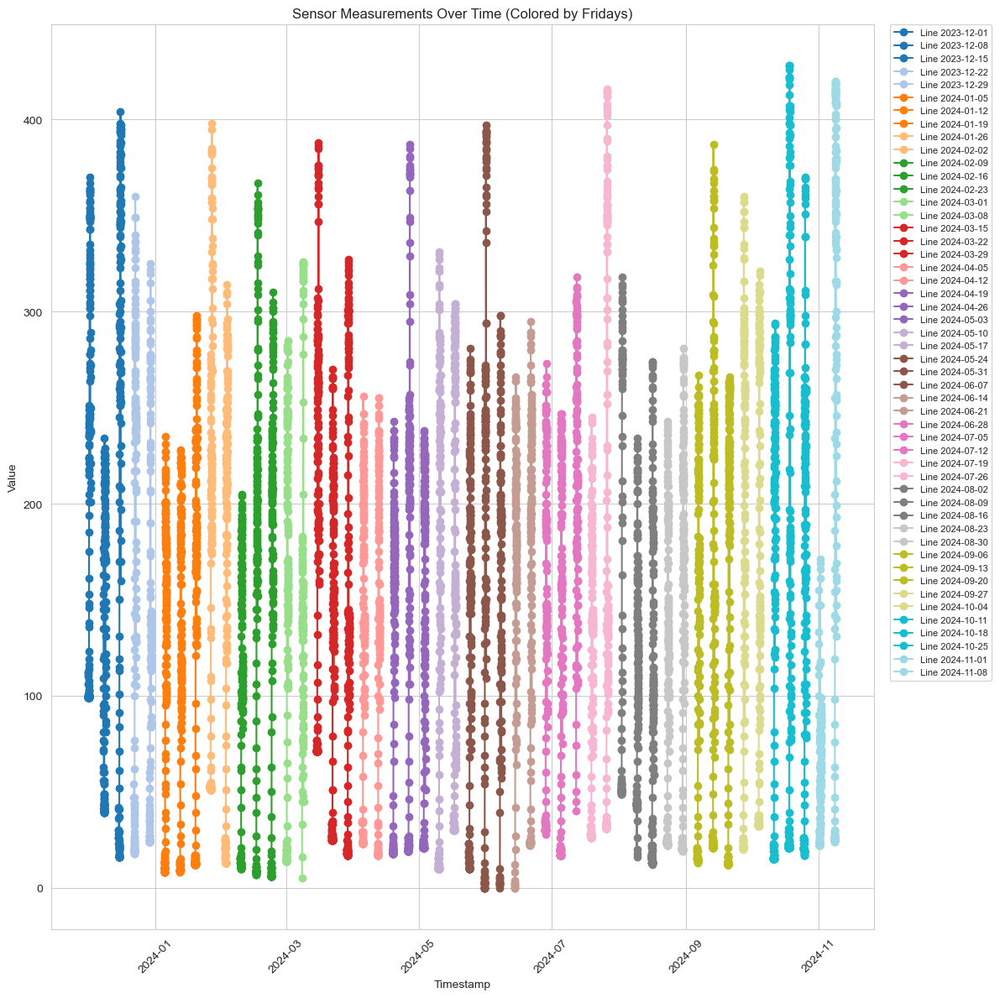

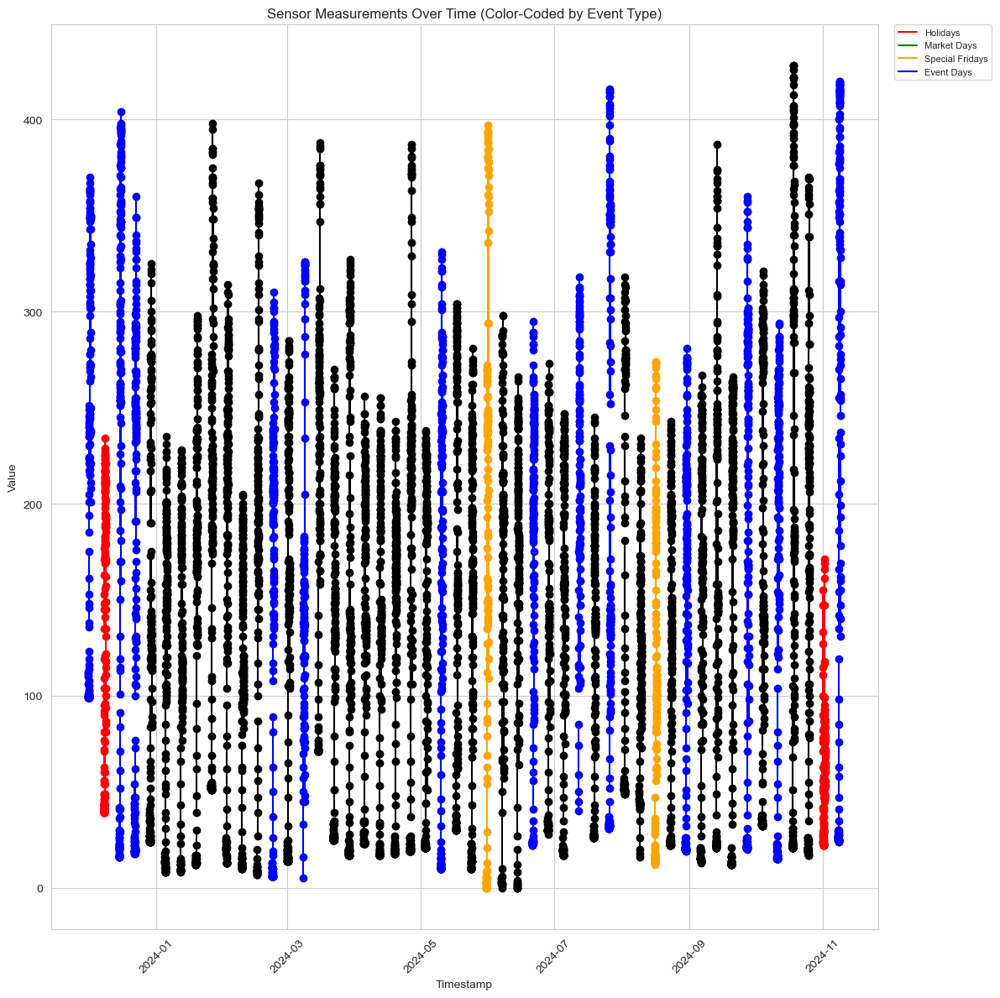

In [15]:
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = friday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(12, 12))
# Plot each line with a unique color
for i, (date, group) in enumerate(friday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by Fridays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()
plt.figure(figsize=(12, 12))

# Create a custom color mapping
unique_dates_friday = friday_df['hour_timestamp'].unique()
event_colors_friday = []

for timestamp in unique_dates_friday:
    # Find the corresponding row for this date
    event_row_friday = friday_df[friday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row_friday['holiday'],
        event_row_friday['event_name'],
        event_row_friday['market_day'],
        event_row_friday['special_friday']
        
    )
    event_colors_friday.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(friday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors_friday[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

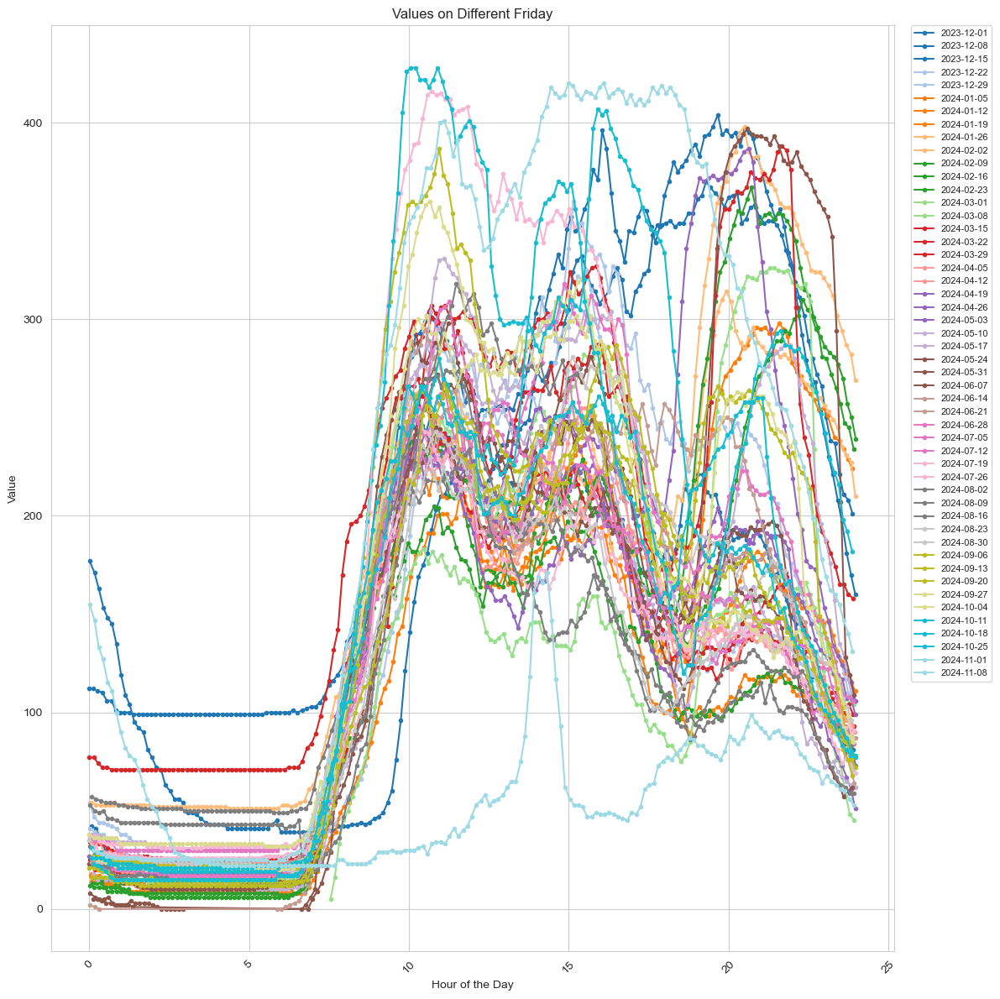

In [457]:
friday_df.loc[:,'hour'] = friday_df['timestamp'].dt.hour + friday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(friday_df.groupby('date')):
    subset = friday_df[friday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='.', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Friday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


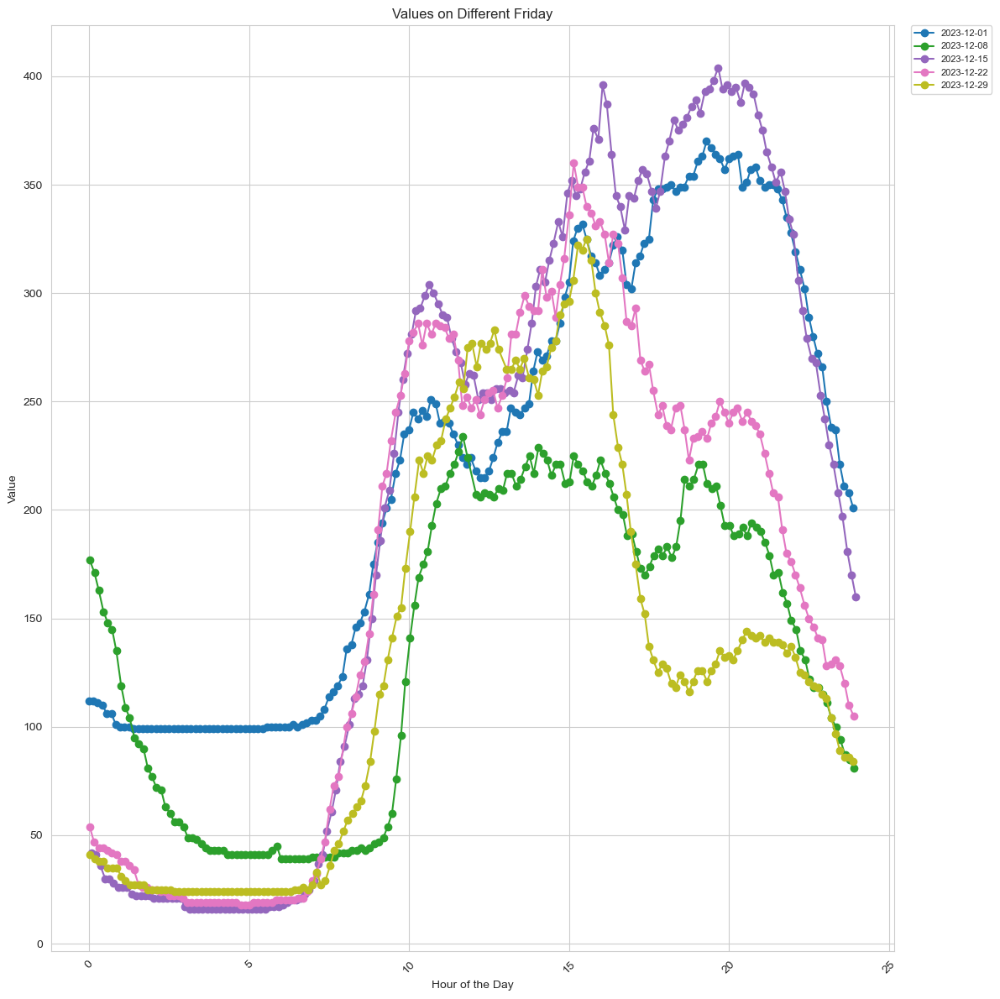

In [465]:
friday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Friday']
friday_df.loc[:, 'hour'] = friday_df['timestamp'].dt.hour + friday_df['timestamp'].dt.minute / 60
friday_df = friday_df[(friday_df['timestamp'] >= pd.to_datetime('2023-11-30')) & (
            friday_df['timestamp'] <= pd.to_datetime('2023-12-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = friday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(friday_df.groupby('date')):
    subset = friday_df[friday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Friday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


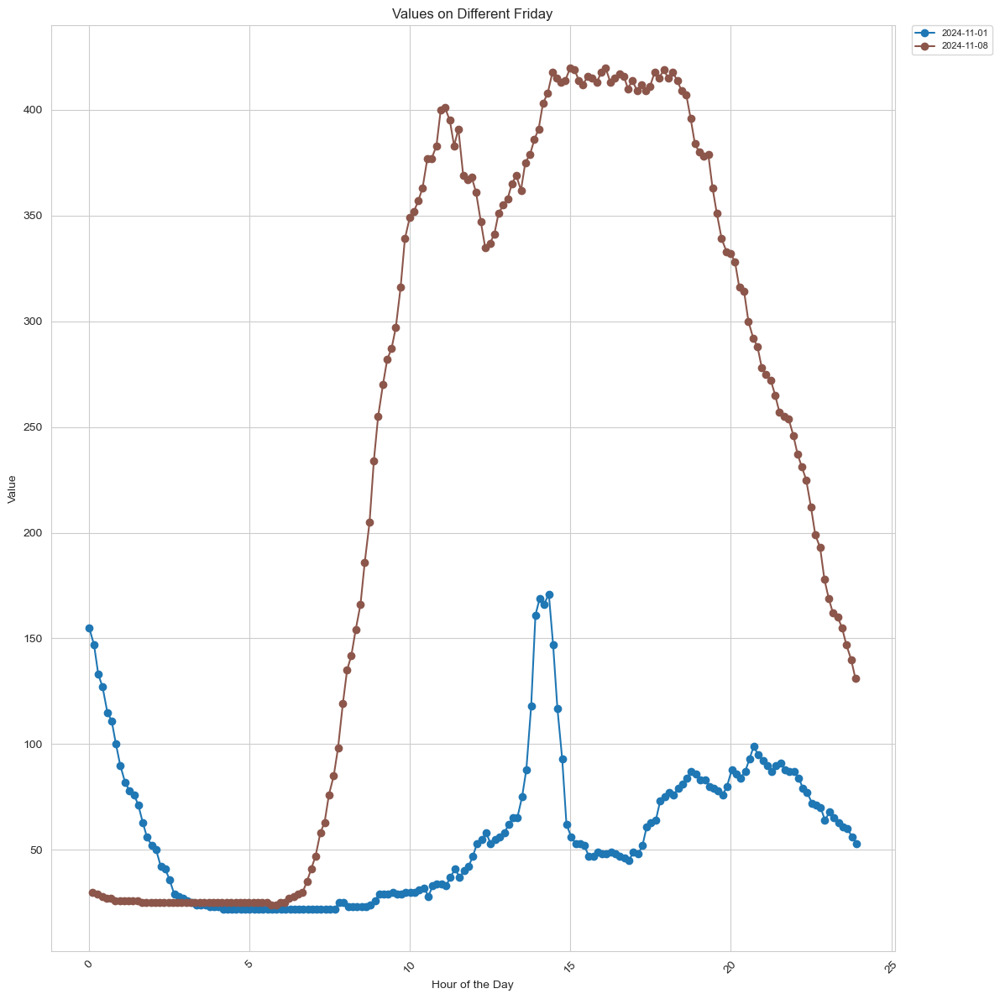

In [467]:
friday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Friday']
friday_df.loc[:, 'hour'] = friday_df['timestamp'].dt.hour + friday_df['timestamp'].dt.minute / 60
friday_df = friday_df[(friday_df['timestamp'] >= pd.to_datetime('2024-11-01')) & (
            friday_df['timestamp'] <= pd.to_datetime('2024-11-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = friday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(friday_df.groupby('date')):
    subset = friday_df[friday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Friday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
684         utilization 2023-12-02 00:01:46    194 2023-12-02 00:00:00   
687         utilization 2023-12-02 00:10:33    187 2023-12-02 00:00:00   
688         utilization 2023-12-02 00:18:49    183 2023-12-02 00:00:00   
690         utilization 2023-12-02 00:27:05    179 2023-12-02 00:00:00   
692         utilization 2023-12-02 00:35:21    174 2023-12-02 00:00:00   
...                 ...                 ...    ...                 ...   
115524      utilization 2024-11-09 23:22:25    101 2024-11-09 23:00:00   
115526      utilization 2024-11-09 23:30:41     99 2024-11-09 23:00:00   
115528      utilization 2024-11-09 23:38:57     99 2024-11-09 23:00:00   
115530      utilization 2024-11-09 23:47:13     93 2024-11-09 23:00:00   
115532      utilization 2024-11-09 23:55:29     91 2024-11-09 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...  rhum  prcp_y  \
684     2023-12-02     NaN  -0.5  -2

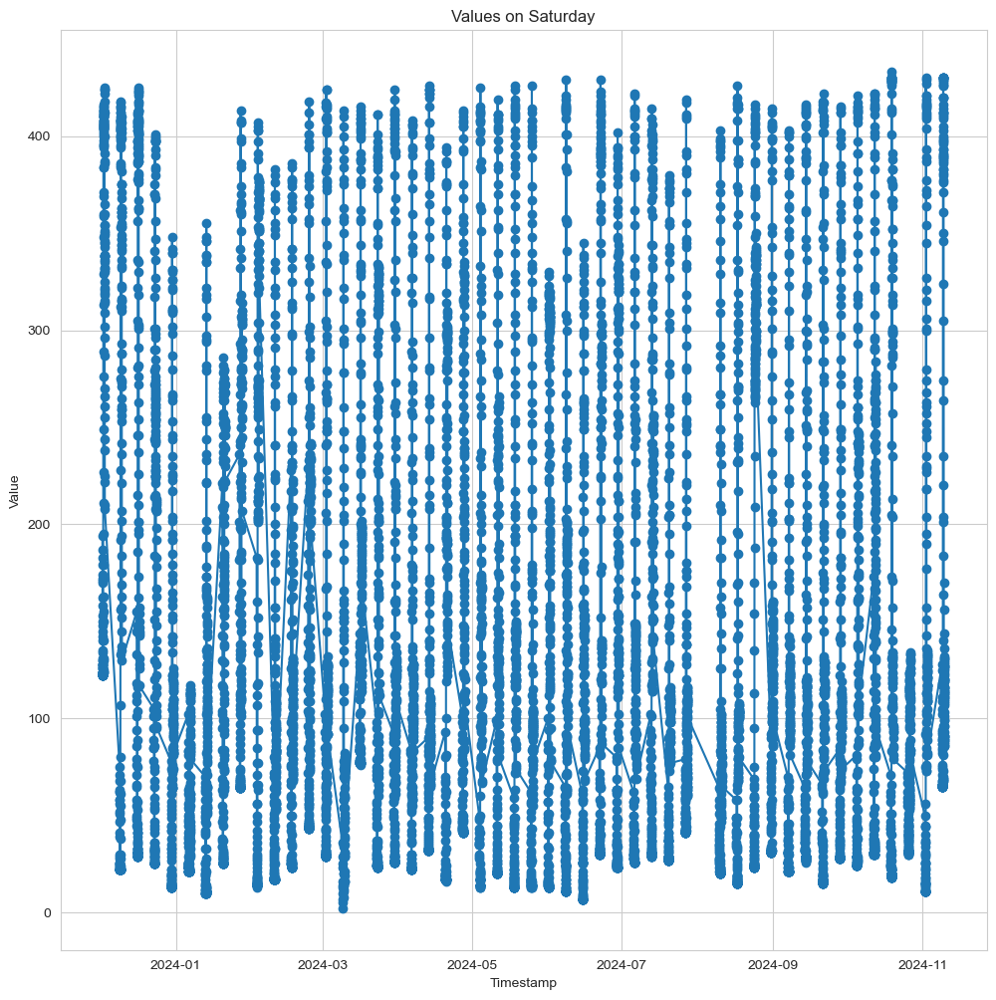

In [17]:
saturday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Saturday']
print(saturday_df)
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(saturday_df['timestamp'], saturday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Saturday')
plt.grid(True)
plt.show()

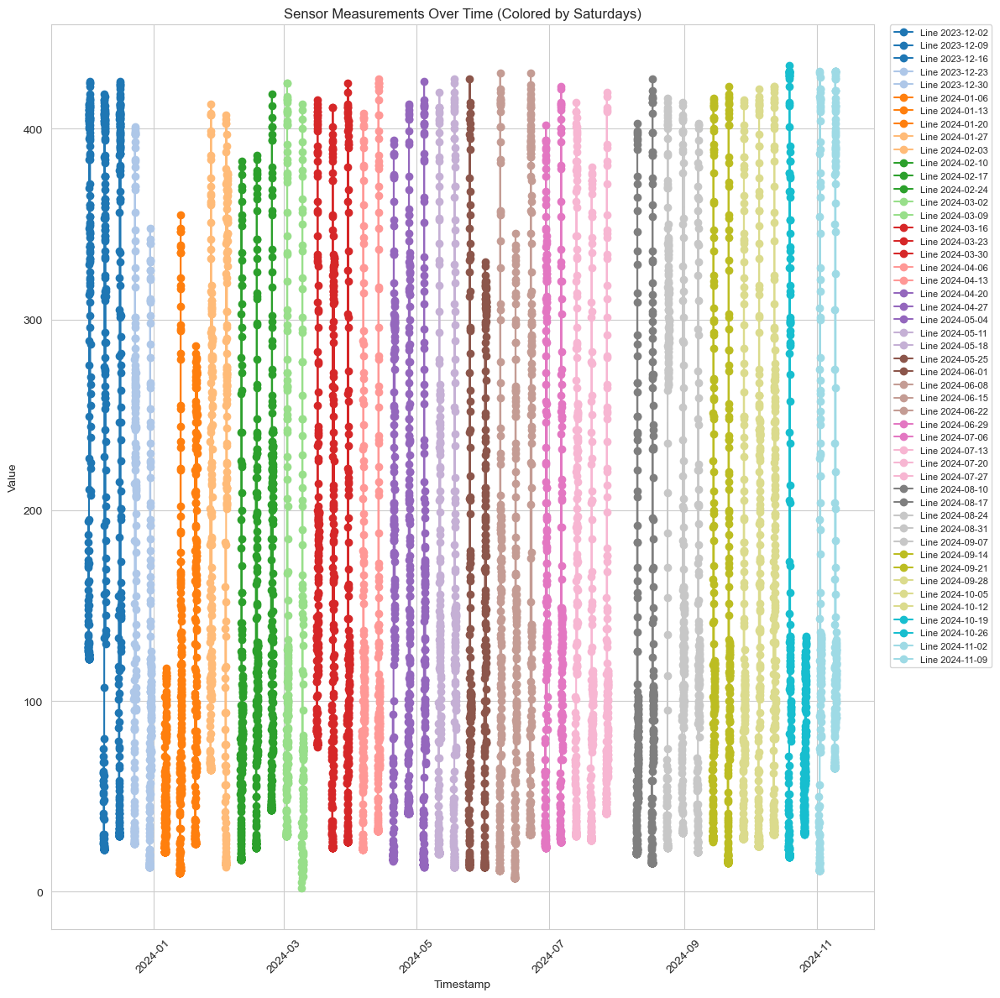

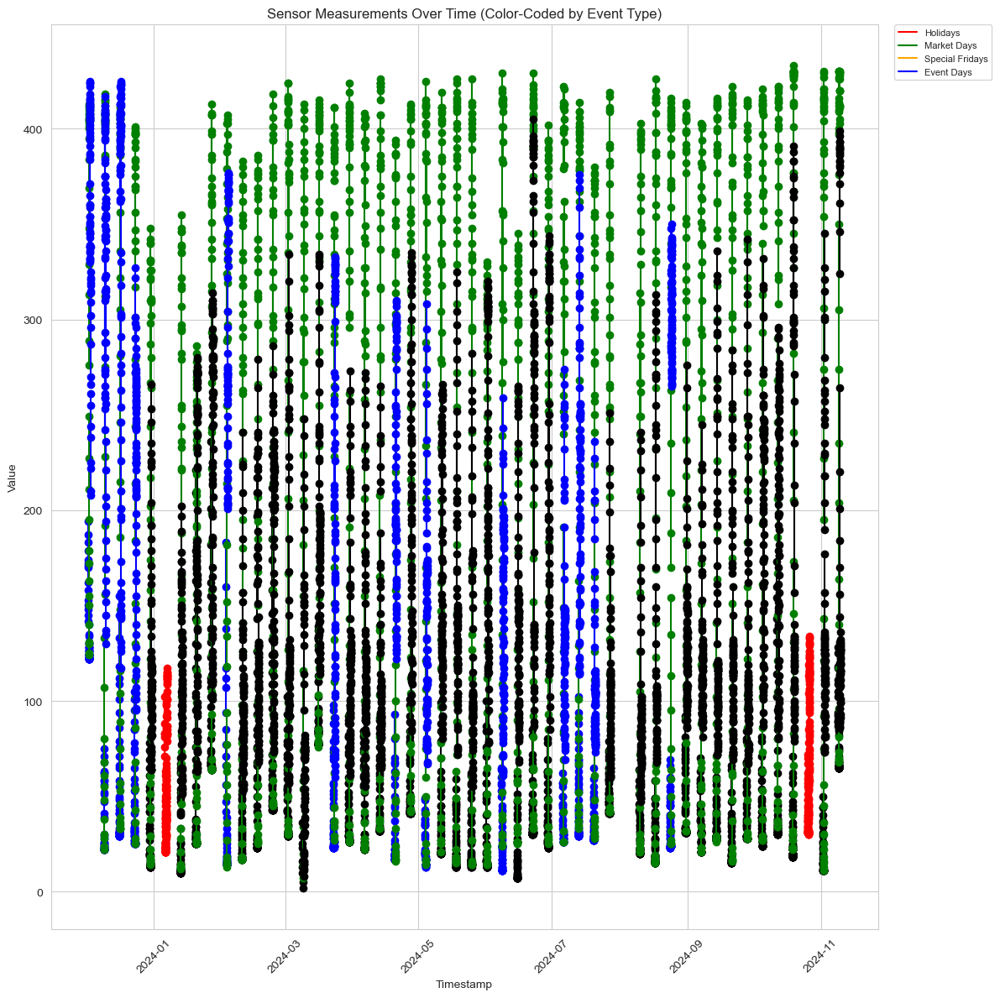

In [18]:
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = saturday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(12, 12))
# Plot each line with a unique color
for i, (date, group) in enumerate(saturday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by Saturdays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()
plt.figure(figsize=(12, 12))

# Create a custom color mapping
unique_dates_saturday = saturday_df['hour_timestamp'].unique()
event_colors_saturday = []

for timestamp in unique_dates_saturday:
    # Find the corresponding row for this date
    event_row_saturday = saturday_df[saturday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row_saturday['holiday'],
        event_row_saturday['event_name'],
        event_row_saturday['market_day'],
        event_row_saturday['special_friday']
        
    )
    event_colors_saturday.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(saturday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors_saturday[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


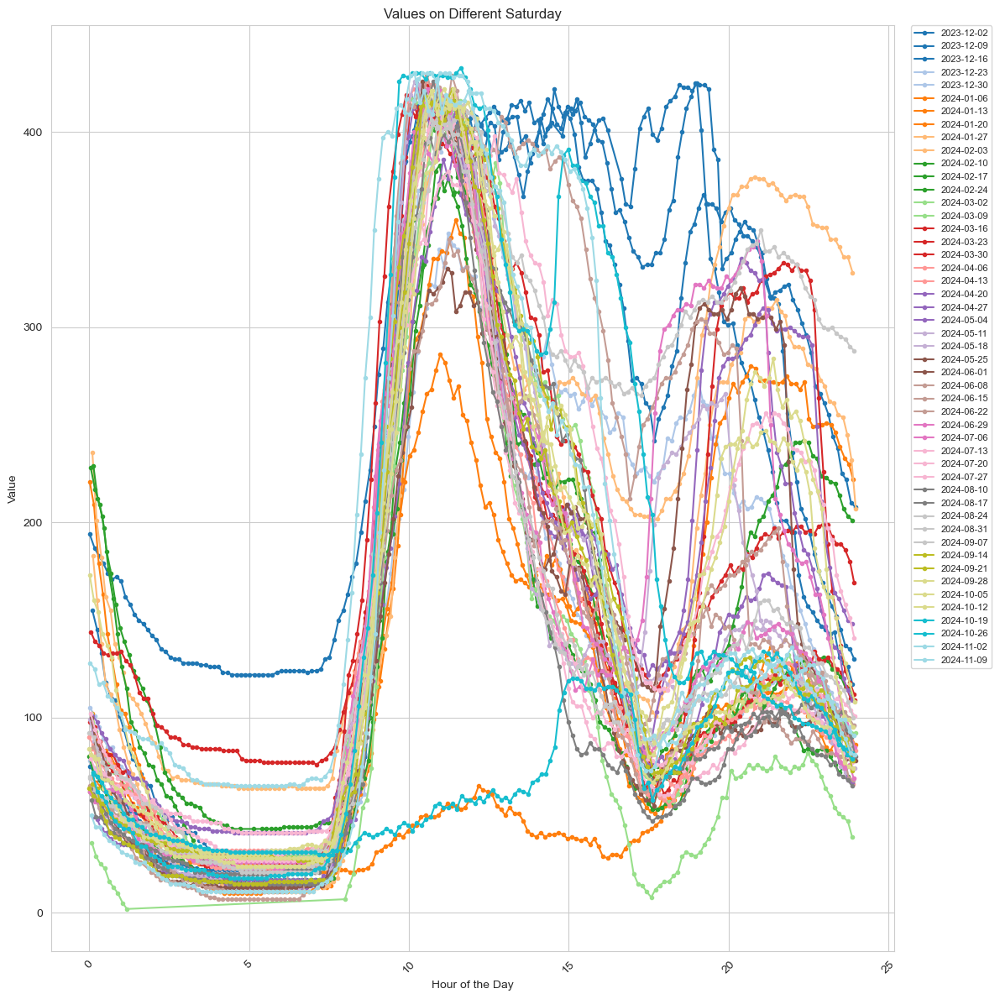

In [19]:
saturday_df.loc[:,'hour'] = saturday_df['timestamp'].dt.hour + saturday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(saturday_df.groupby('date')):
    subset = saturday_df[saturday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='.', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Saturday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
1028        utilization 2023-12-03 00:06:58    205 2023-12-03 00:00:00   
1030        utilization 2023-12-03 00:15:14    201 2023-12-03 00:00:00   
1033        utilization 2023-12-03 00:23:30    195 2023-12-03 00:00:00   
1034        utilization 2023-12-03 00:31:46    191 2023-12-03 00:00:00   
1036        utilization 2023-12-03 00:40:02    184 2023-12-03 00:00:00   
...                 ...                 ...    ...                 ...   
115870      utilization 2024-11-10 23:24:32     31 2024-11-10 23:00:00   
115872      utilization 2024-11-10 23:32:49     31 2024-11-10 23:00:00   
115874      utilization 2024-11-10 23:41:05     31 2024-11-10 23:00:00   
115876      utilization 2024-11-10 23:49:21     31 2024-11-10 23:00:00   
115878      utilization 2024-11-10 23:57:37     31 2024-11-10 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...  rhum  prcp_y  \
1028    2023-12-03     NaN  -3.7  -7

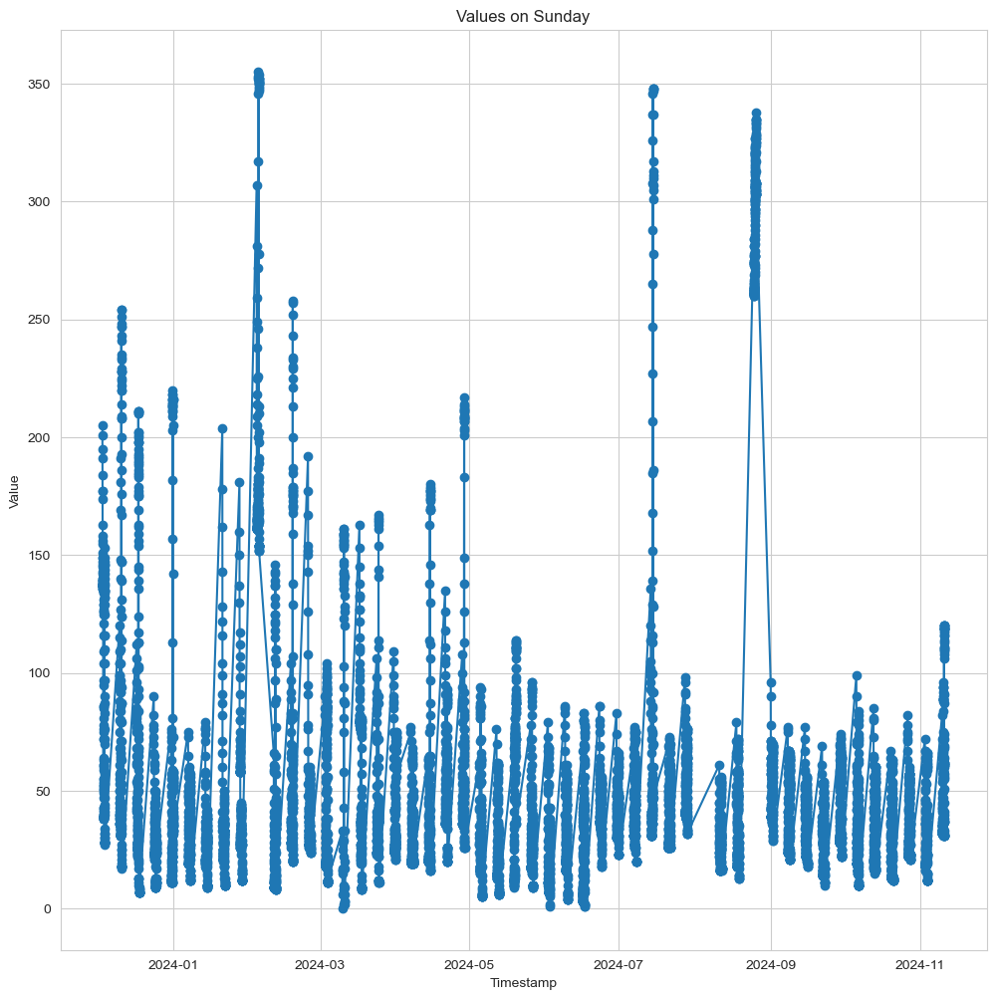

In [20]:
sunday_df = filtered_df[filtered_df['timestamp'].dt.day_name() == 'Sunday']
print(sunday_df)
# Plot the data
plt.figure(figsize=(12, 12))
plt.plot(sunday_df['timestamp'], sunday_df['value'], marker='o', linestyle='-')
plt.xlabel('Timestamp')
plt.ylabel('Value')
plt.title('Values on Sunday')
plt.grid(True)
plt.show()

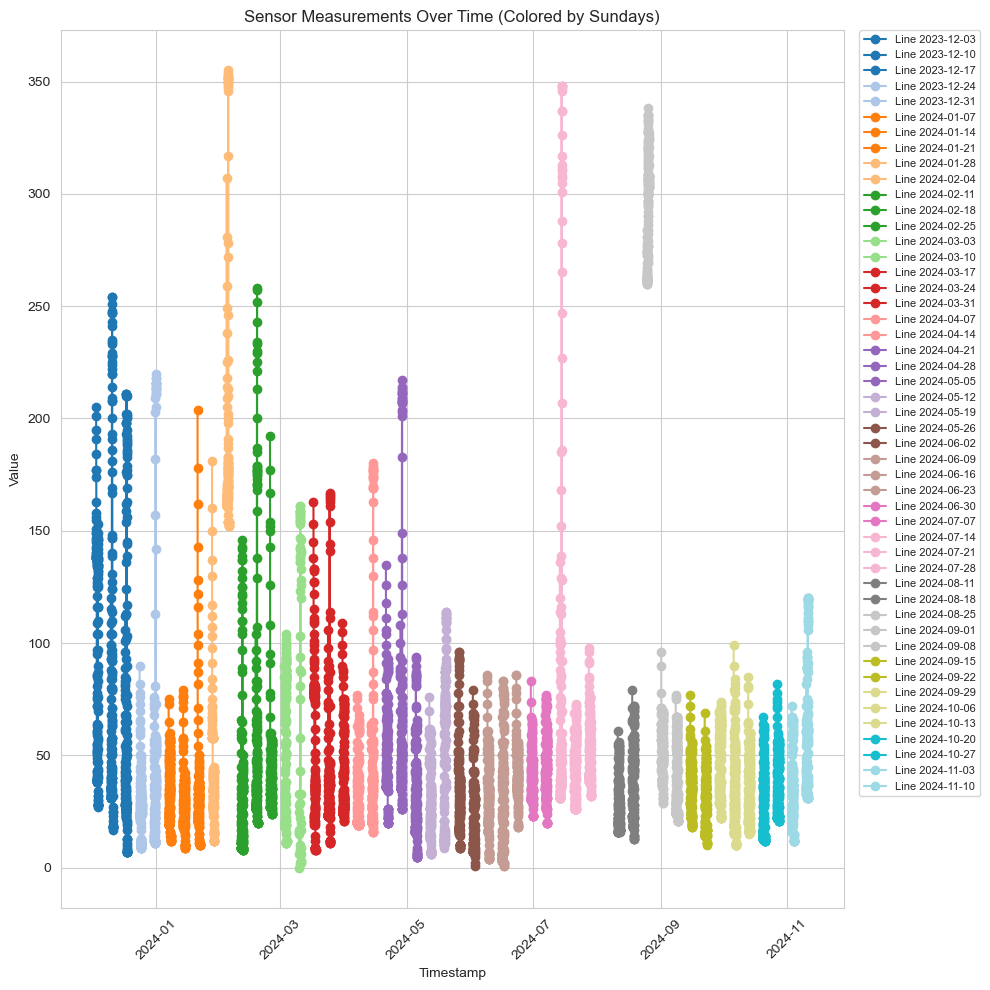

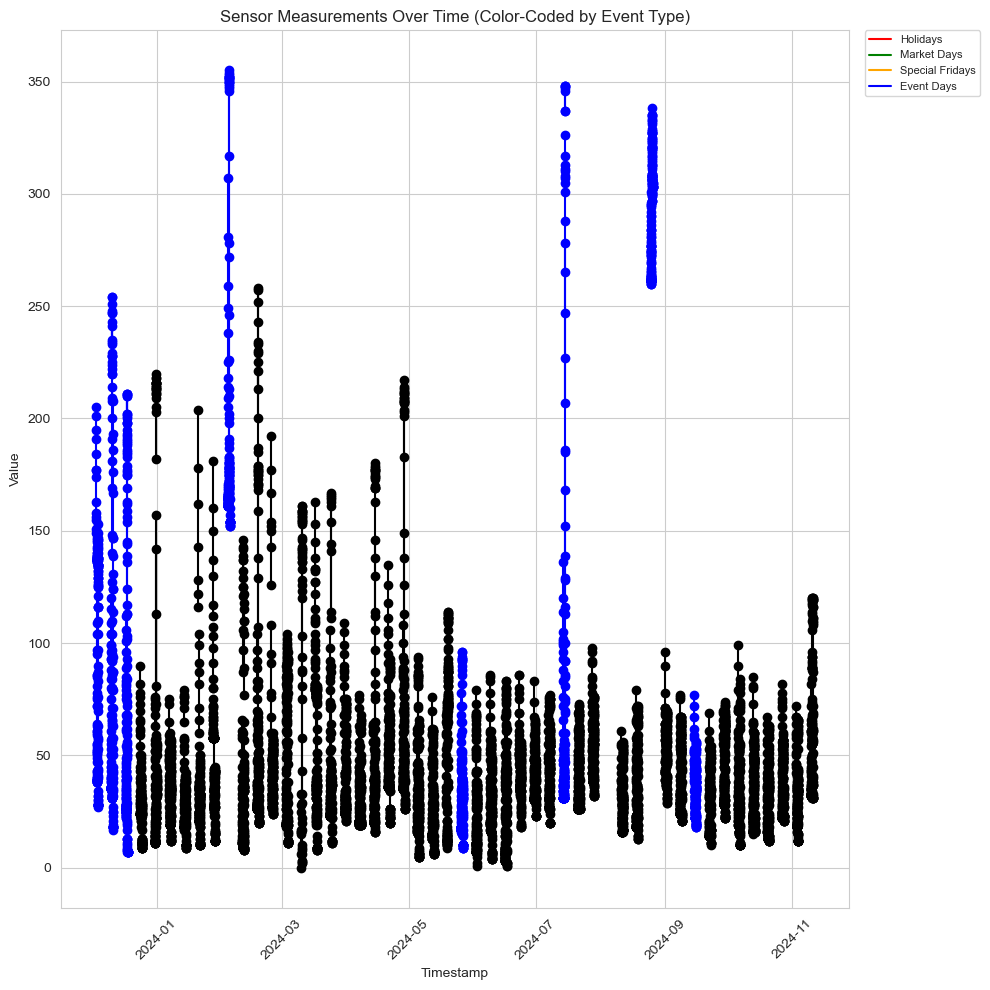

In [22]:
cmap = plt.get_cmap("tab20")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = sunday_df['date'].nunique()
colors = [cmap(i / unique_lines) for i in range(unique_lines)]
plt.figure(figsize=(10, 10))
# Plot each line with a unique color
for i, (date, group) in enumerate(sunday_df.groupby('date')):
    plt.plot(group['timestamp'], group['value'], marker='o', linestyle='-', 
             color=colors[i], label=f'Line {date}')
# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Colored by Sundays)")
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()
plt.figure(figsize=(10, 10))

# Create a custom color mapping
unique_dates_sunday = sunday_df['hour_timestamp'].unique()
event_colors_sunday = []

for timestamp in unique_dates_sunday:
    # Find the corresponding row for this date
    event_row_sunday = sunday_df[sunday_df['hour_timestamp'] == timestamp].iloc[0]
    
    # Determine color based on event types
    color = get_event_color(
        event_row_sunday['holiday'],
        event_row_sunday['event_name'],
        event_row_sunday['market_day'],
        event_row_sunday['special_friday']
        
    )
    event_colors_sunday.append(color)
    
    
    # Plot each line with color-coded by event type
for i, (date, group) in enumerate(sunday_df.groupby('hour_timestamp')):
    plt.plot(group['hour_timestamp'], group['value'], marker='o', linestyle='-', 
             color=event_colors_sunday[i], label=f'{date}')

# Formatting
plt.xlabel("Timestamp")
plt.ylabel("Value")
plt.title("Sensor Measurements Over Time (Color-Coded by Event Type)")
plt.grid(True)
plt.xticks(rotation=45)

# Create a custom legend with color explanation
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], color='red', label='Holidays'),
    Line2D([0], [0], color='green', label='Market Days'),
    Line2D([0], [0], color='orange', label='Special Fridays'),
    Line2D([0], [0], color='blue', label='Event Days')
]

# Move the legend outside the plot
plt.legend(handles=legend_elements, loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()
plt.show()

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


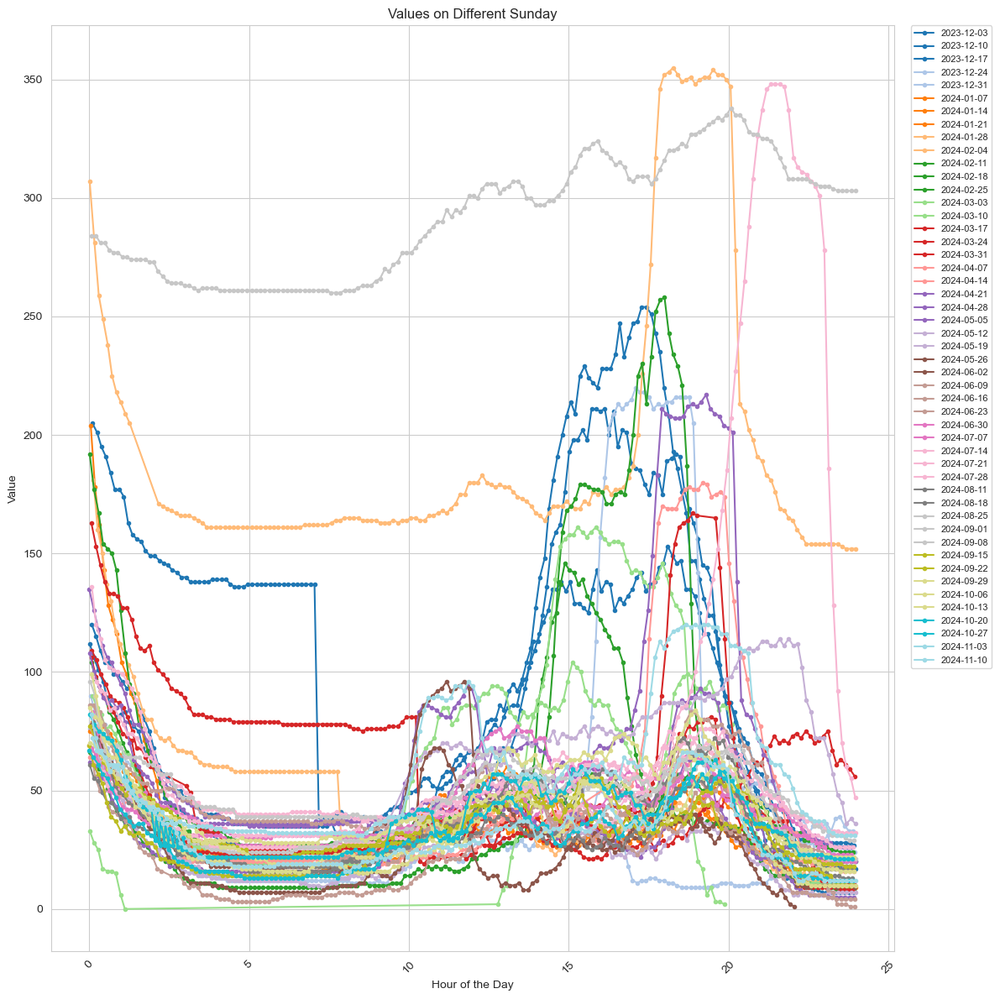

In [496]:
sunday_df.loc[:,'hour'] = sunday_df['timestamp'].dt.hour + sunday_df['timestamp'].dt.minute / 60

# Plot the data
plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(sunday_df.groupby('date')):
    subset = sunday_df[sunday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='.', linestyle='-', color=colors[i],  label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Sunday')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()

       measurement_name           timestamp  value      hour_timestamp  \
1028        utilization 2023-12-03 00:06:58    205 2023-12-03 00:00:00   
1030        utilization 2023-12-03 00:15:14    201 2023-12-03 00:00:00   
1033        utilization 2023-12-03 00:23:30    195 2023-12-03 00:00:00   
1034        utilization 2023-12-03 00:31:46    191 2023-12-03 00:00:00   
1036        utilization 2023-12-03 00:40:02    184 2023-12-03 00:00:00   
...                 ...                 ...    ...                 ...   
115870      utilization 2024-11-10 23:24:32     31 2024-11-10 23:00:00   
115872      utilization 2024-11-10 23:32:49     31 2024-11-10 23:00:00   
115874      utilization 2024-11-10 23:41:05     31 2024-11-10 23:00:00   
115876      utilization 2024-11-10 23:49:21     31 2024-11-10 23:00:00   
115878      utilization 2024-11-10 23:57:37     31 2024-11-10 23:00:00   

              date holiday  tavg  tmin  tmax  prcp_x  ...  rhum  prcp_y  \
1028    2023-12-03     NaN  -3.7  -7

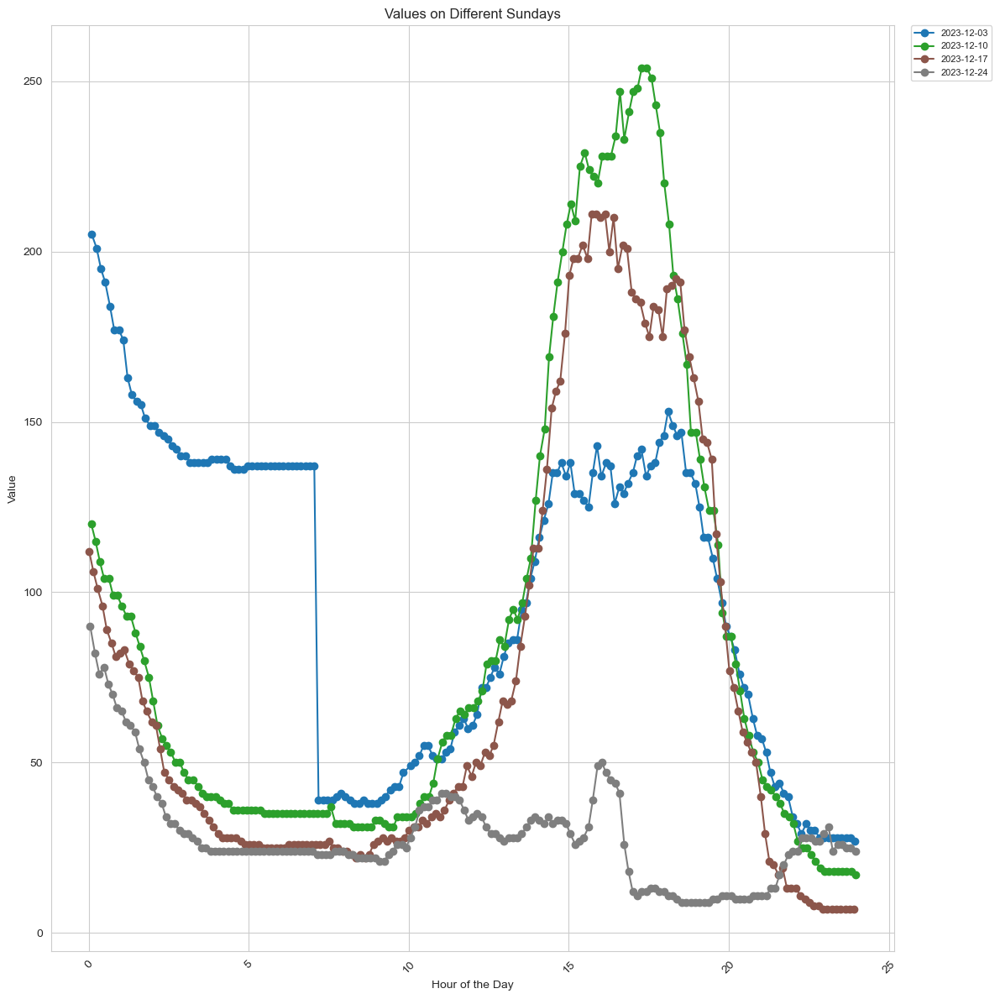

In [497]:
sunday_df = sunday_df[sunday_df['timestamp'].dt.day_name() == 'Sunday']
sunday_df.loc[:, 'hour'] = sunday_df['timestamp'].dt.hour + sunday_df['timestamp'].dt.minute / 60
print(sunday_df)
sunday_df = sunday_df[(sunday_df['timestamp'] >= pd.to_datetime('2023-12-01')) & (
            sunday_df['timestamp'] <= pd.to_datetime('2023-12-30'))]

scmap = plt.get_cmap("tab10")  # Options: "viridis", "plasma", "tab10", "tab20", etc.
unique_lines = sunday_df['date'].nunique()
less_colors = [scmap(i / unique_lines) for i in range(unique_lines)]

plt.figure(figsize=(12, 12))
for i, (date, group) in enumerate(sunday_df.groupby('date')):
    subset = sunday_df[sunday_df['date'] == date]
    plt.plot(subset['hour'], subset['value'], marker='o', linestyle='-', color=less_colors[i], label=str(date))

plt.xlabel('Hour of the Day')
plt.ylabel('Value')
plt.title('Values on Different Sundays')
plt.legend(title='Date')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate timestamps for better visibility

# Move the legend **outside** the plot
plt.legend(loc="upper left", bbox_to_anchor=(1.02, 1), borderaxespad=0, fontsize=8)

# Adjust layout to fit the legend
plt.tight_layout()

plt.show()